# TPC-C Multi-Tenant with Distributed PVC and Tuned PostgreSQL 17.5

* data is generated and loaded into databases in a distributed filesystem
* experiments do not use preloaded data

* PostgreSQL uses improved args:
```
# --- Connection & Worker Processes ---
- "-c"
- "max_connections=1500"       # https://www.postgresql.org/docs/current/runtime-config-connection.html#GUC-MAX-CONNECTIONS
- "-c"
- "max_worker_processes=128"   # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-WORKER-PROCESSES
- "-c"
- "max_parallel_workers=64"    # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-PARALLEL-WORKERS
- "-c"
- "max_parallel_workers_per_gather=8"  # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-PARALLEL-WORKERS-PER-GATHER
- "-c"
- "max_parallel_maintenance_workers=8" # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-PARALLEL-MAINTENANCE-WORKERS

# --- Memory Settings ---
- "-c"
- "shared_buffers=256GB"       # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-SHARED-BUFFERS
- "-c"
- "effective_cache_size=350GB" # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-EFFECTIVE-CACHE-SIZE
- "-c"
- "work_mem=128MB"             # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-WORK-MEM
- "-c"
- "maintenance_work_mem=4GB"   # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAINTENANCE-WORK-MEM
- "-c"
- "temp_buffers=64MB"          # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-TEMP-BUFFERS
- "-c"
- "wal_buffers=16MB"           # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-BUFFERS
- "-c"
- "autovacuum_work_mem=1GB"    # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-WORK-MEM

# --- Autovacuum ---
- "-c"
- "autovacuum=on"                            # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM
- "-c"
- "autovacuum_max_workers=10"               # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-MAX-WORKERS
- "-c"
- "autovacuum_vacuum_cost_limit=1000"       # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-VACUUM-COST-LIMIT
- "-c"
- "vacuum_cost_limit=1000"                  # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-VACUUM-COST-LIMIT
- "-c"
- "autovacuum_naptime=15s"                  # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-NAPTIME
- "-c"
- "autovacuum_vacuum_cost_delay=20ms"       # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-VACUUM-COST-DELAY

# --- WAL & Checkpoints (Ceph-optimized) ---
- "-c"
- "wal_level=replica"                       # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-LEVEL
- "-c"
- "wal_compression=on"                      # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-COMPRESSION
- "-c"
- "wal_writer_delay=500ms"                  # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-WRITER-DELAY
- "-c"
- "commit_delay=10000"                      # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-COMMIT-DELAY
- "-c"
- "synchronous_commit=off"                  # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-SYNCHRONOUS-COMMIT
- "-c"
- "max_wal_size=2GB"                        # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-MAX-WAL-SIZE
- "-c"
- "min_wal_size=1GB"                        # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-MIN-WAL-SIZE
- "-c"
- "checkpoint_timeout=15min"                # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-CHECKPOINT-TIMEOUT
- "-c"
- "checkpoint_completion_target=0.9"        # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-CHECKPOINT-COMPLETION-TARGET

# --- Planner Cost Tweaks (CephFS) ---
- "-c"
- "random_page_cost=4.0"                    # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-RANDOM-PAGE-COST
- "-c"
- "seq_page_cost=1.5"                       # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-SEQ-PAGE-COST
- "-c"
- "cpu_tuple_cost=0.01"                     # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-CPU-TUPLE-COST
- "-c"
- "effective_io_concurrency=2"              # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-EFFECTIVE-IO-CONCURRENCY
- "-c"
- "default_statistics_target=500"           # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-DEFAULT-STATISTICS-TARGET

# --- Locks and Limits ---
- "-c"
- "max_locks_per_transaction=128"           # https://www.postgresql.org/docs/current/runtime-config-locks.html#GUC-MAX-LOCKS-PER-TRANSACTION
- "-c"
- "max_pred_locks_per_transaction=128"      # https://www.postgresql.org/docs/current/runtime-config-locks.html#GUC-MAX-PRED-LOCKS-PER-TRANSACTION
- "-c"
- "max_stack_depth=7MB"                     # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-STACK-DEPTH
- "-c"
- "max_files_per_process=4000"              # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-FILES-PER-PROCESS

# --- Miscellaneous ---
- "-c"
- "huge_pages=try"                          # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-HUGE-PAGES
```

In [1]:
import pandas as pd
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np

from bexhoma import collectors

%matplotlib inline

# Functions for Nice Plots

In [2]:
def sanitize_filename(title, max_length=100):
    # Replace non-alphanumeric characters with underscores
    safe = re.sub(r'[^a-zA-Z0-9-_]+', '_', title.strip())
    # Truncate to a safe length
    return safe[:max_length].rstrip('_')
    
def plot_bars(df, y, title, estimator):
    df_plot = df.copy()
    #df_plot = df_plot[df_plot['client']=='1']
    df_plot = df_plot.sort_values(['num_tenants','type'])
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    # Create the plot
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=df_plot,
        x='num_tenants',
        y=y,
        hue='type',
        estimator=estimator,
        palette='Set2',
        hue_order=hue_order
    )
    show_height = False
    if show_height:
        for bar in ax.patches:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,  # X: center of bar
                    height,                             # Y: top of bar
                    f'{height:.1f}',                    # Text (1 decimal place)
                    ha='center', va='bottom', fontsize=8
                )
    # Get tick positions (i.e., the x-axis categories)
    xticks = ax.get_xticks()
    bar_width = ax.patches[0].get_width()
    # Create a mapping from (num_tenants, type) to hatch
    grouped = df_plot.groupby(['num_tenants', 'type']).agg({y: estimator}).reset_index()
    #print(grouped)
    grouped_dict = {(row['num_tenants'], row['type']): hatch_map[row['type']] for _, row in grouped.iterrows()}
    bars = sorted(ax.patches, key=lambda bar: bar.get_x() if bar.get_height() > 0 else 10000)
    for bar, (_, row) in zip(bars, grouped.iterrows()):
        bar.my_id = (row['num_tenants'], row['type'])  # or anything else like an index or uuid
        bar.set_hatch(hatch_map[row['type']]) #grouped_dict[(bar.my_id)])
        bar.set_edgecolor('black')
        bar.set_linewidth(1)
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
    # Final touches
    plt.legend(title='Type')
    ax.legend(fontsize=18)
    #ax.legend(fontsize=18, loc='upper left', bbox_to_anchor=(1, 1))  # move outside
    plt.title(f"{title}", fontsize=24)
    #plt.title(f"{title} by Number of Tenants and Type", fontsize=24)
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    # Remove y-axis label
    ax.set_ylabel('')  # or ax.set(ylabel='')
    plt.tight_layout()
    filename = "tpcc_" + filename_prefix + sanitize_filename(title) + ".png"    
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_boxplots(df, y, title):
    plt.figure(figsize=(10, 6))
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot boxplots grouped by num_tenants and colored by type
    ax = sns.boxplot(
        data=df,
        x='num_tenants',
        y=y,#'Goodput (requests/second)',
        hue='type',
        palette='Set2'  # consistent colors per type
    )
    # Add vertical separator lines between groups
    # Get the number of unique num_tenants and type
    num_groups = df['num_tenants'].nunique()
    num_types = df['type'].nunique()
    
    # Extract hue order
    hue_order = ax.get_legend_handles_labels()[1]
    num_hue = len(hue_order)
    
    # Get hue order from seaborn (types)
    _, type_order = ax.get_legend_handles_labels()
    num_types = len(type_order)
    
    #print(len(ax.patches))
    # Set hatches correctly: patches are grouped by x then by hue
    for i, patch in enumerate(ax.patches):
        #print(i)
        type_index = i // (num_groups)
        if type_index >= num_types:
            break
        type_name = type_order[type_index]
        patch.set_hatch(hatch_map.get(type_name, ''))
        #print(hatch_map.get(type_name, ''))
        patch.set_edgecolor('black')
        patch.set_linewidth(1)
    
    # Each num_tenants group has num_types boxes
    for i in range(1, num_groups):
        xpos = i - 0.5 #0.5
        ax.axvline(x=xpos, color='gray', linestyle='--', alpha=0.5)
    
    
    # Update legend with matching hatches
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
        handle.set_edgecolor('black')
        handle.set_linewidth(1)
    
    #title = "Goodput [req/s] Distribution per Tenant"
    plt.title(title, fontsize=24)
    plt.xlabel("Number of Tenants")
    plt.ylabel("")#"Goodput (requests/second)")
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    plt.legend(title="Type")
    ax.legend(fontsize=18)
    plt.tight_layout()
    filename = "tpcc_" + filename_prefix + sanitize_filename(title) + ".png"    
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

# Collect Results

In [3]:
path = r"C:\data\benchmarks"
#path = r"/home/perdelt/benchmarks"
filename_prefix = "cpupolicy_"

In [4]:
codes = [
    "1755712809", # container 1
    "1755709687", # database 1
    "1755706475", # schema 1

    "1755696350", # container 2
    "1755693435", # database 2
    "1755690481", # schema 2

    "1755723522", # container 3
    "1755720064", # database 3
    "1755716684", # schema 3

    "1755734267", # container 4
    "1755730711", # database 4
    "1755727170", # schema 4
]

codes

['1755712809',
 '1755709687',
 '1755706475',
 '1755696350',
 '1755693435',
 '1755690481',
 '1755723522',
 '1755720064',
 '1755716684',
 '1755734267',
 '1755730711',
 '1755727170']

In [5]:
collect = collectors.benchbase(path, codes)

# Get all Metrics Names

In [6]:
code = codes[0]
evaluate = collect.get_evaluator(code)
df_metrics=collect.get_metrics(evaluate)
df_metrics

,title,active,type,metric
total_cpu_memory,Memory Usage [MiB],True,cluster,gauge
total_cpu_memory_cached,Memory Usage Cached [MiB],True,cluster,gauge
total_cpu_util,CPU Utilization [%],True,cluster,gauge
total_cpu_throttled,CPU Throttle [%],True,cluster,gauge
total_cpu_throttled_s,CPU Throttled Time [s],True,cluster,counter
total_cpu_util_others,CPU Utilization Others [%],False,cluster,gauge
total_cpu_util_s,CPU Utilization Time [s],True,cluster,counter
total_cpu_util_user_s,CPU User Time [s],True,cluster,counter
total_cpu_util_sys_s,CPU System Time [s],True,cluster,counter
total_cpu_util_others_s,CPU Utilization Time Others [s],False,cluster,counter


# Get Aggregated Values for an Experiment

In [7]:
def show_summary_monitoring_table(evaluation, type):
    component='stream'
    #scale = 1
    results = []
    for idx, row in df_metrics.iterrows():
        if row["active"] == False:
            continue
        #print(idx, row["title"])
        metric_name = idx
        method = 'diff' if row["metric"] == 'counter' else 'mean'
        col_name = row["title"]
        #scale = metric[3] if len(metric) > 3 else 1
        df = evaluation.get_monitoring_metric(metric=metric_name, component=component)
        # Apply scaling if needed
        #if scale != 1:
        #    df = df * scale
        # Process dataframe according to method
        if method == 'diff':
            processed = df.max().sort_index() - df.min().sort_index()
        elif method == 'max':
            processed = df.max().sort_index()
        elif method == 'mean':
            processed = df.mean().sort_index()
        else:
            raise ValueError(f"Unknown processing method: {method}")
        df_cleaned = pd.DataFrame(processed)
        df_cleaned.columns = [col_name]
        results.append(df_cleaned)
    # Combine all dataframes horizontally (join on index)
    summary_df = pd.concat(results, axis=1).round(2)
    #summary_df = summary_df.reindex(index=evaluators.natural_sort(summary_df.index))
    return summary_df

# Get Values Aggregated per SUT for an Experiment

In [8]:
def get_monitoring_new(evaluation, type="stream"):
    """
    Retrieves and aggregates monitoring metrics for a specified component type, grouped by client.

    This function obtains detailed monitoring data using `show_summary_monitoring_table` for the
    specified component type (default "stream"). It adds a 'client' column extracted from the DataFrame index,
    then aggregates various hardware and application metrics by client using sum or mean as appropriate.

    :param evaluation: The evaluation object containing monitoring data.
    :type evaluation: object
    :param type: The component type to filter monitoring metrics (default is "stream").
    :type type: str, optional
    :return: A DataFrame with aggregated monitoring metrics grouped by client. If no data is available, returns None.
    :rtype: pandas.DataFrame or None
    """
    df_monitoring = show_summary_monitoring_table(evaluation, type)
    if len(df_monitoring) > 0:
        df = df_monitoring.copy()  # avoid modifying original
        df['client'] = df.index.str.rsplit('-', n=1).str[-1]
        #print(df)
        """agg_dict = {
            'CPU [CPUs]': 'sum',
            'Max RAM [Gb]': 'sum',
            'Max RAM Cached [Gb]': 'sum',
            'Max CPU': 'sum',
            'CPU Throttled': 'sum',
            'Locks': 'sum',
            'Access Exclusive': 'sum',
            'Access Share': 'sum',
            'Exclusive': 'sum',
            'Row Exclusive': 'sum',
            'Row Share': 'sum',
            'Share': 'sum',
            'Share Row Exclusive': 'sum',
            'Share Update Exclusive': 'sum',
            'SI Read': 'sum',
            'Active': 'sum',
            'Idle': 'sum',
            'Transactions Idle': 'sum',
            'Transactions Aborted': 'sum',
            'Block Hits': 'sum',
            'Block Reads': 'sum',
            'Heap Reads': 'sum',
            'Heap Hits': 'sum',
            'Sync Time': 'sum',
            'Write Time': 'sum',
            'Number Autoanalyze': 'sum',
            'Number Autovacuum': 'sum',
            'Cache Hit Ratio [%]': 'mean',
            'Variance of Core Util [%]': 'max',
        }"""
        agg_dict = df_monitoring.columns
        # Filter aggregation dictionary to only include columns present in df
        #filtered_agg_dict = {col: func for col, func in agg_dict.items() if col in df.columns}
        filtered_agg_dict = {col: 'sum' for col in agg_dict if col in df.columns}
        #print(filtered_agg_dict)
        # Apply groupby with filtered aggregation
        result = df.groupby('client').agg(filtered_agg_dict).reset_index()
        return result

# Get Values Aggregated per SUT and per Experiment

In [9]:
type="stream"
df_performance = pd.DataFrame()
for code in codes:
    evaluation = collect.get_evaluator(code)
    workload = collect.get_workload(code)
    df = get_monitoring_new(evaluation, type)
    if df is None:
        print(code, df)
        continue
    df['type'] = workload['tenant_per']
    df['num_tenants'] = workload['num_tenants']
    df['code']=code
    df_performance = pd.concat([df_performance, df])
df_performance = df_performance.sort_values(['num_tenants', 'type'])
df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],10041.5,14915.16,9954.95,14696.05,10052.53,14919.49,25577.48,41376.06,16083.83,26656.29,...,15161.15,20305.79,16279.7,22863.36,36671.66,48443.74,18382.7,24026.29,18389.12,24168.41
Memory Usage Cached [MiB],20115.85,30144.54,19278.99,28908.07,19954.64,28658.81,55784.51,76376.31,39700.67,54651.05,...,30301.35,40473.43,35199.29,44741.94,62877.56,86392.13,36269.23,47179.1,36094.08,48551.65
CPU Utilization [%],15.92,15.39,15.0,16.29,16.12,15.29,1.83,1.5,0.64,0.98,...,17.23,18.92,22.46,18.56,44.79,42.82,20.47,19.46,19.53,18.43
CPU Throttle [%],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],20009.97,19021.29,18789.19,19963.08,20393.69,18717.36,36342.17,37168.74,22757.25,22993.46,...,22249.87,23160.28,28303.94,23075.85,55863.03,52194.26,25169.08,23826.08,23836.72,23788.51
CPU User Time [s],12787.23,12146.13,12478.03,12931.04,13176.14,12150.74,23868.35,24486.85,15402.54,15167.38,...,14511.87,15072.57,18663.38,15089.93,37210.21,35570.4,16615.36,15811.24,15676.49,15944.63
CPU System Time [s],7222.74,6875.16,6311.16,7032.04,7217.55,6566.63,12473.81,12681.88,7354.71,7826.07,...,7738.0,8087.71,9640.56,7985.92,18652.83,16623.85,8553.72,8014.84,8160.23,7843.88
Core Utilization Variance [%],9.01,8.19,8.2,8.67,8.97,8.69,47.96,51.98,11.01,11.32,...,9.74,10.63,14.68,10.36,218.7,198.1,13.12,12.38,11.47,10.74


# Bar Plots of Aggregated Values per Metric

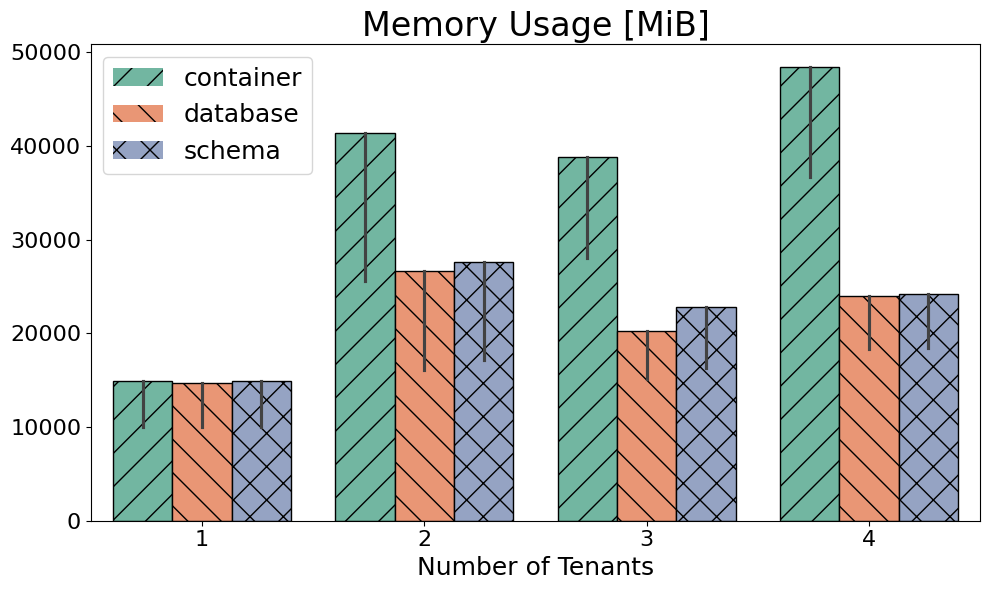

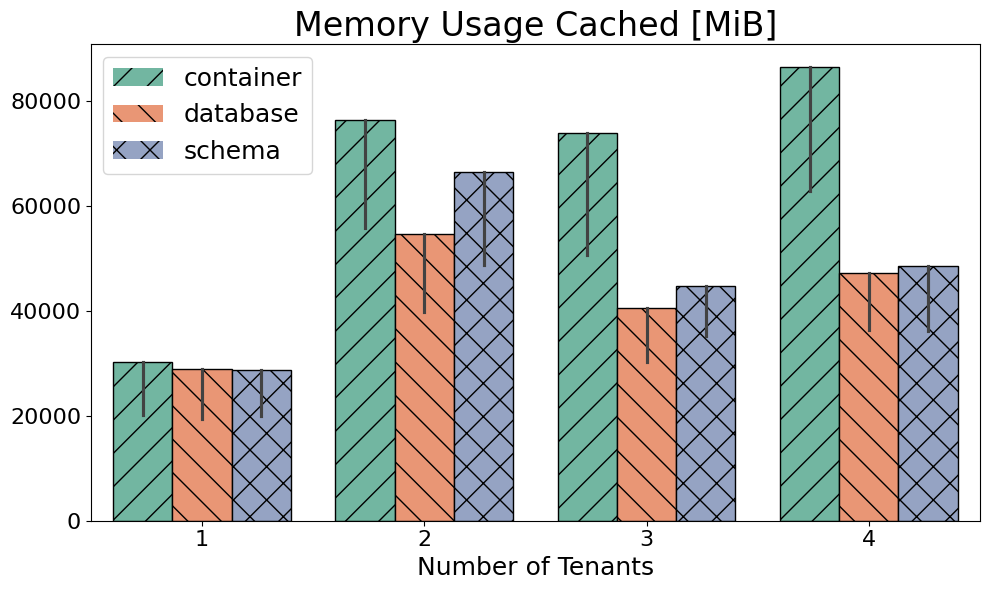

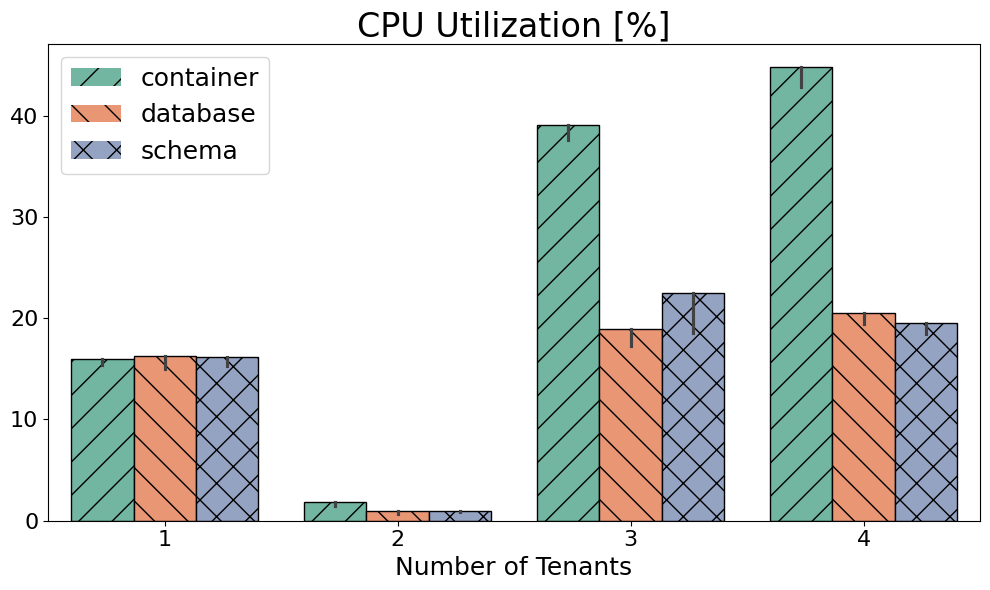

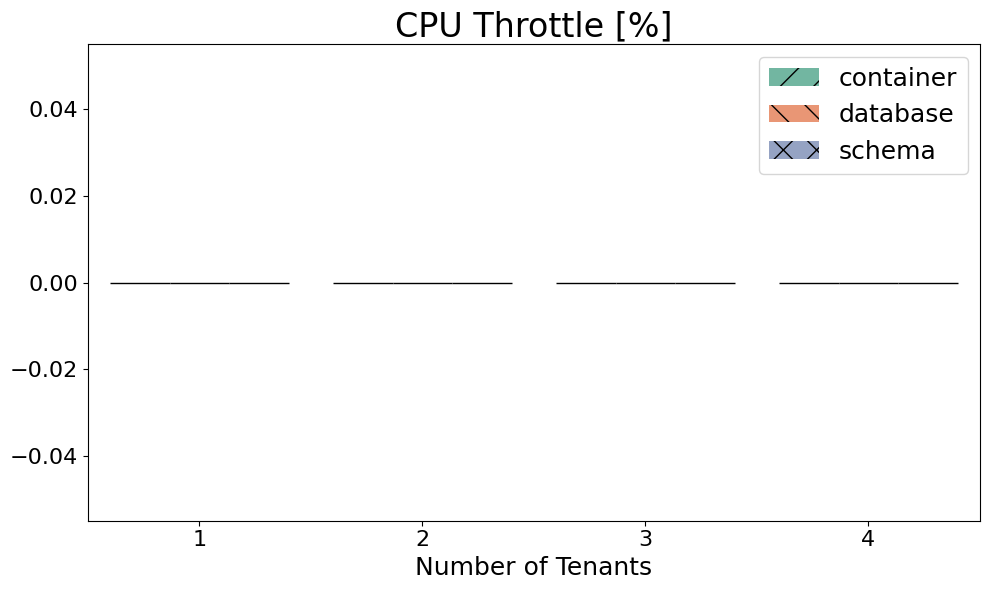

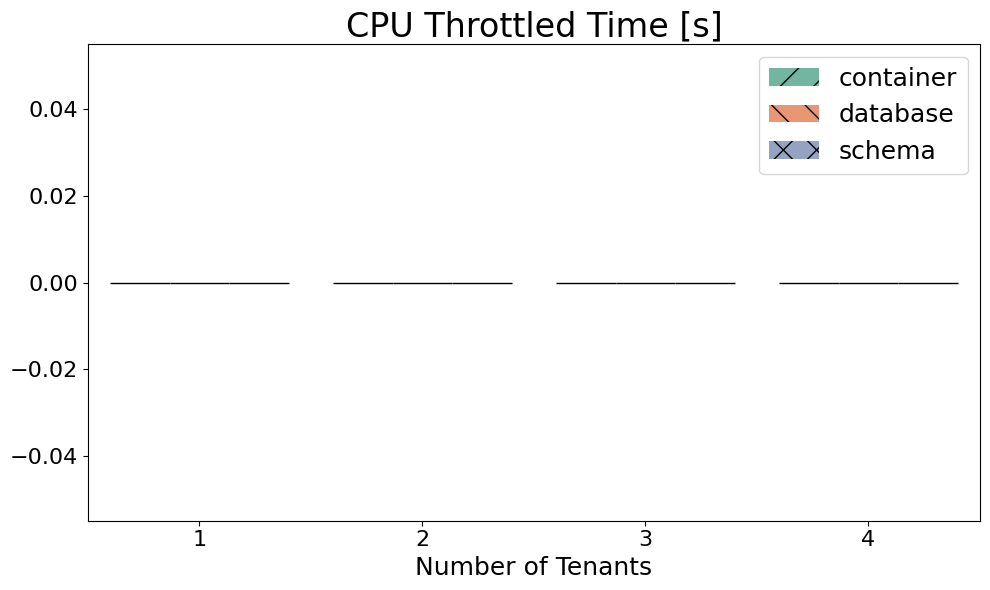

...

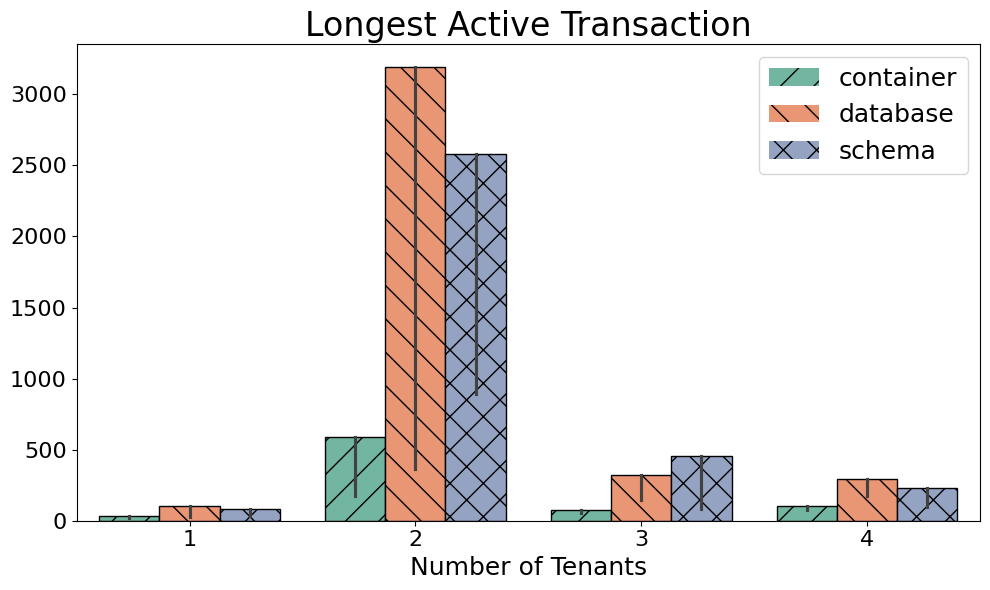

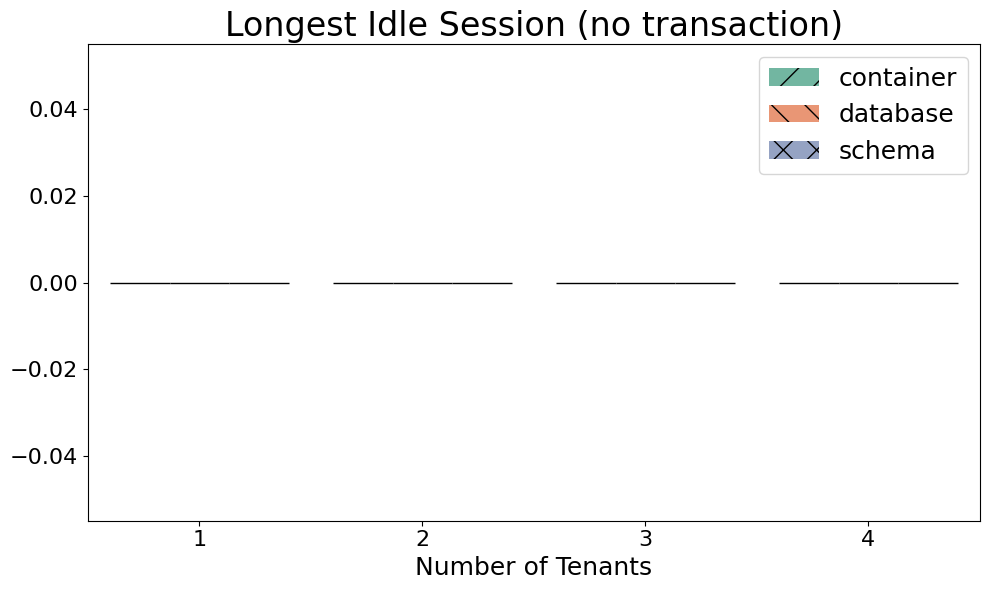

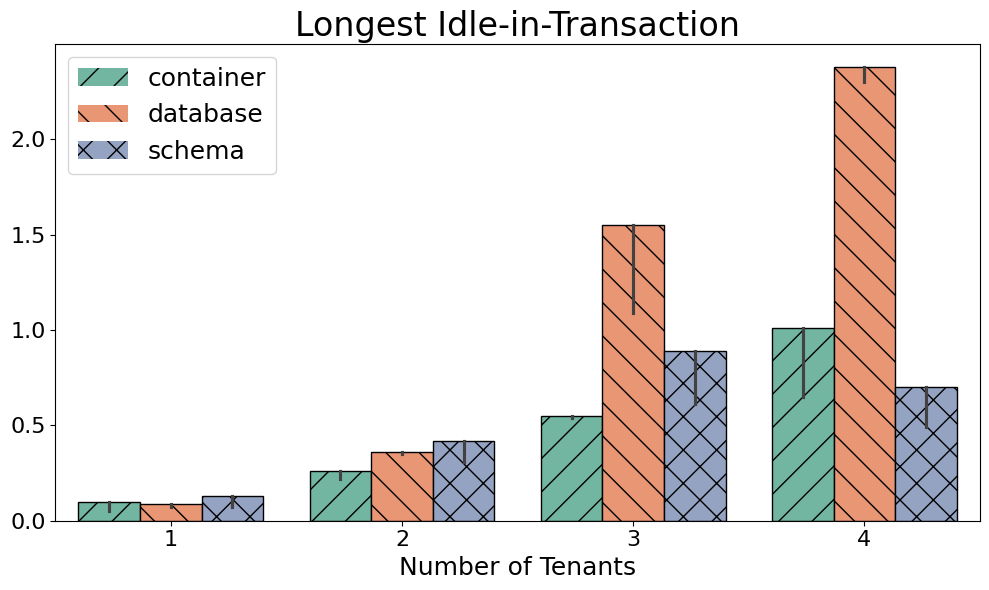

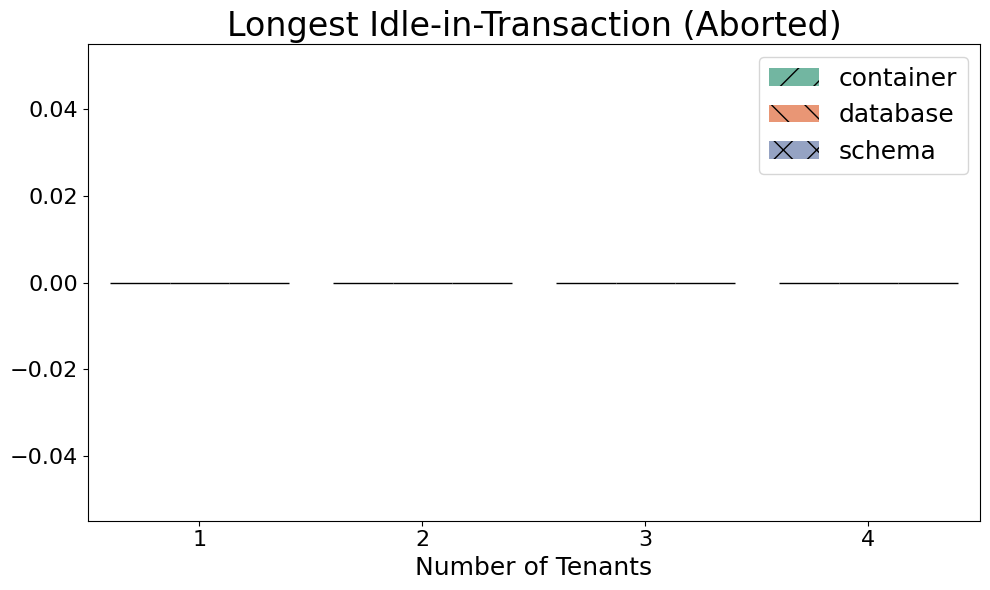

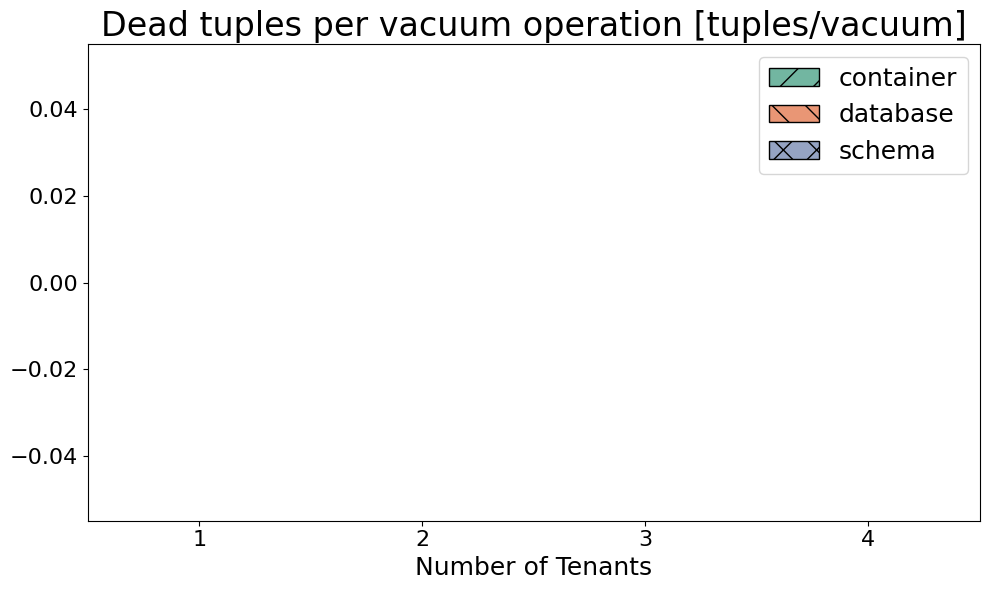

In [10]:
results = []
code = codes[0]
for idx, row in df_metrics.iterrows():
    if row["active"] == False:
        continue
    #print(idx, row["title"])
    #metric_name = idx
    #method = 'diff' if row["metric"] == 'counter' else 'mean'
    col_name = row["title"]
    plot_bars(df_performance, y=col_name, title=col_name, estimator='max')
    #df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric_name)
    #print(df_monitoring)
    #plot_boxplots(df_monitoring, y=metric_name, title=col_name)
    #ax = df_monitoring.boxplot()
    #ax.set_title(col_name)
    #plt.show()

# Monitoring as Time Series

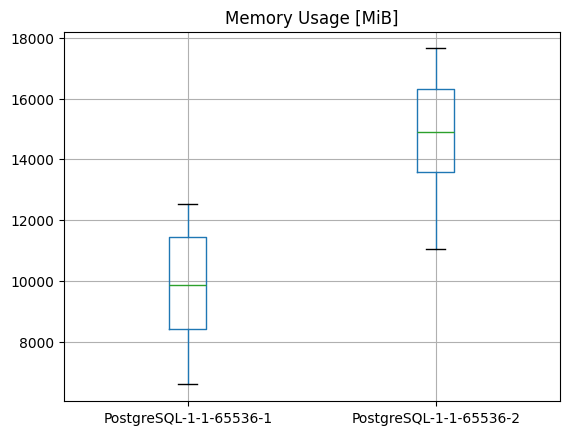

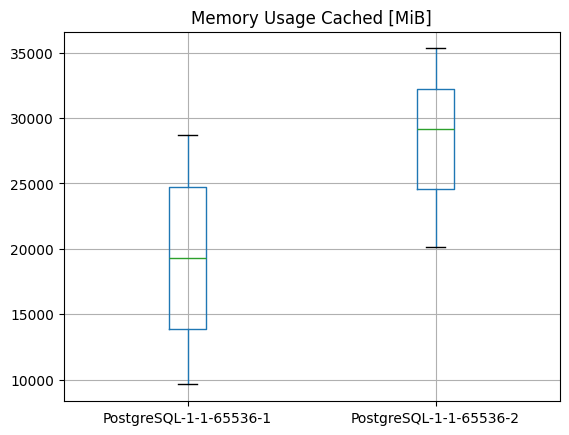

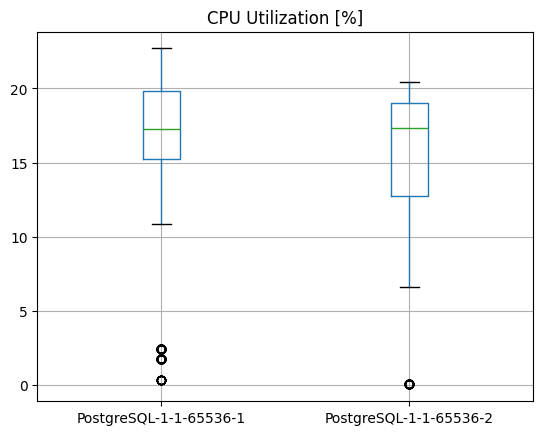

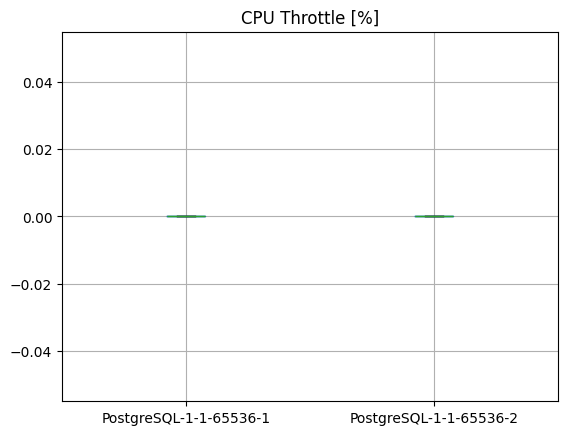

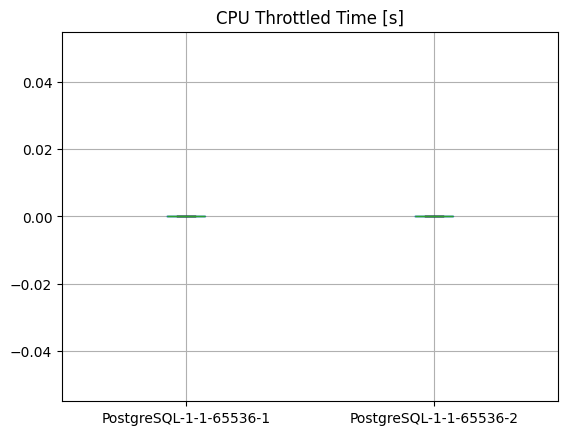

...

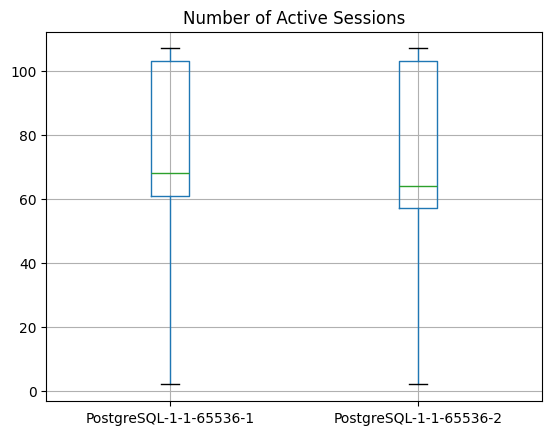

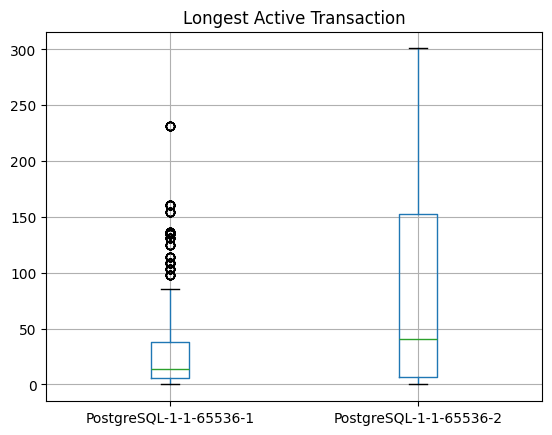

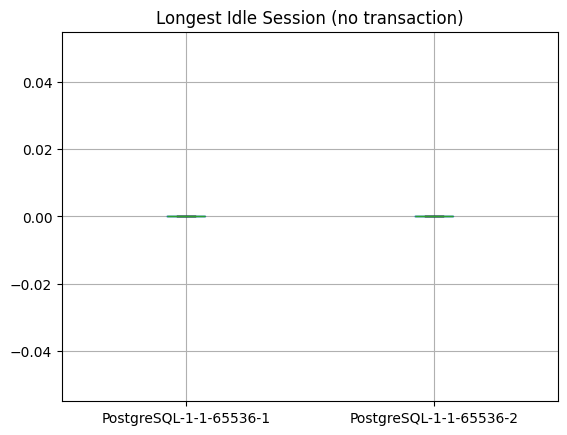

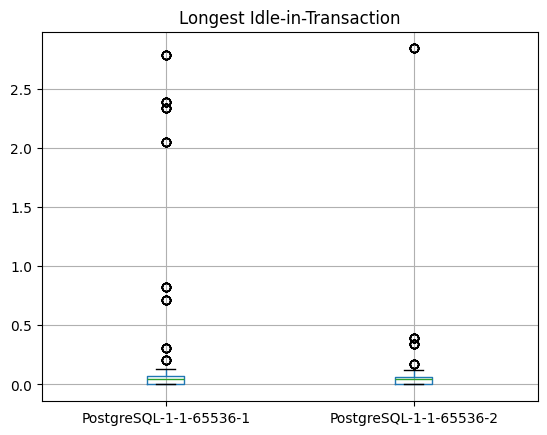

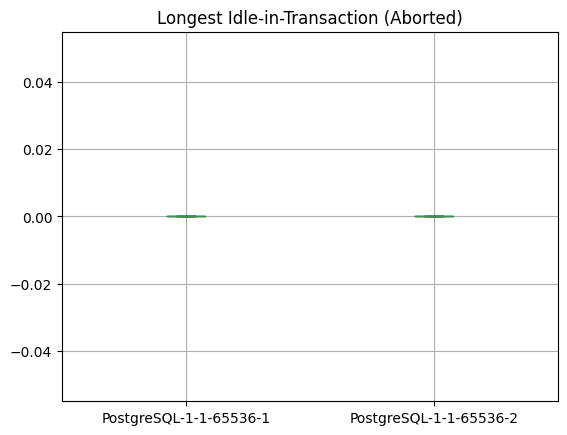

C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\numpy\lib\_function_base_impl.py:4720: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1320: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1327: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1335: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1336: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


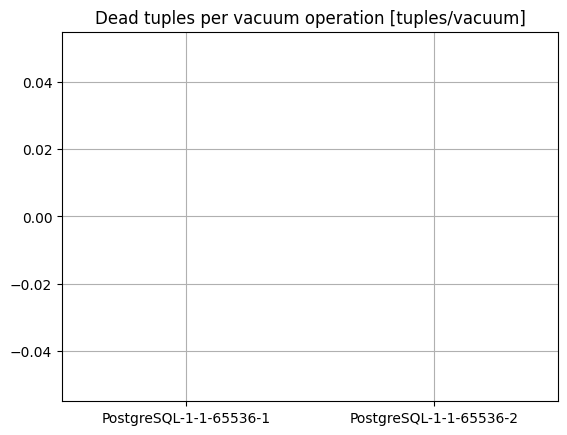

In [11]:
results = []
code = codes[2]
for idx, row in df_metrics.iterrows():
    if row["active"] == False:
        continue
    #print(idx, row["title"])
    metric_name = idx
    method = 'diff' if row["metric"] == 'counter' else 'mean'
    col_name = row["title"]
    df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric_name)
    #print(df_monitoring)
    #plot_boxplots(df_monitoring, y=metric_name, title=col_name)
    ax = df_monitoring.boxplot()
    ax.set_title(col_name)
    plt.show()

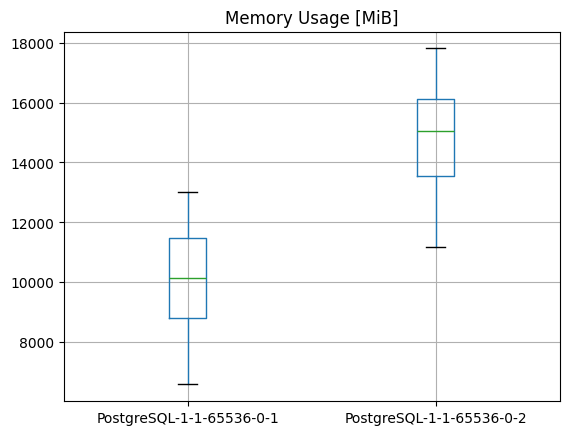

In [12]:
metric = 'pg_stat_activity_max_tx_duration_active'
#metric = 'pg_stat_database_blks_reads'
#metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
code = codes[0]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
#df_monitoring.boxplot()
ax = df_monitoring.boxplot()
ax.set_title(df_metrics.loc[metric]['title'])#metric)
plt.show()

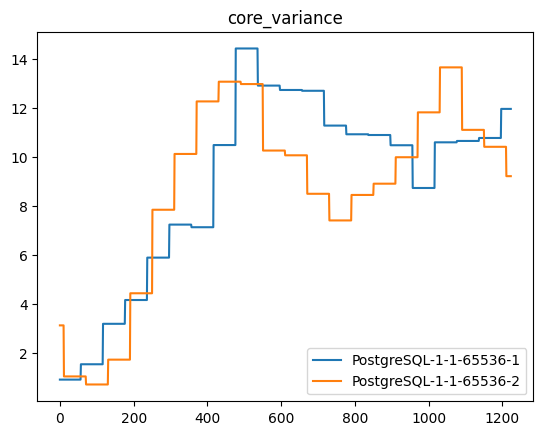

,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536-2
0,0.923307,3.133193
1,0.923307,3.133193
2,0.923307,3.133193
3,0.923307,3.133193
4,0.923307,3.133193
5,0.923307,3.133193
6,0.923307,3.133193
7,0.923307,3.133193
8,0.923307,3.133193
9,0.923307,3.133193


In [13]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'

code = codes[2]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
ax = df_monitoring.plot()
ax.set_title(metric)
plt.show()
df_monitoring

# Get Timeseries of a Metric for all Experiments

In [14]:
def get_monitoring_timeseries_all(metric='pg_locks_count', component="stream"):
    df_performance = pd.DataFrame()
    for code in codes:
        evaluation = collect.get_evaluator(code)
        workload = collect.get_workload(code)
        df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)
        df_monitoring.index.name="timestamp"
        df_long = df_monitoring.reset_index().melt(
            id_vars="timestamp",     # keep timestamp
            var_name="series",       # column name for former column headers
            value_name="value"       # column name for the numbers
        )
        #df_long['client'] = df_long['series'].str.rsplit('-', n=1).str[-1]
        if workload['tenant_per'] == 'container':
            # 1 time series per tenant
            df_long[["tenant", "client"]] = df_long["series"].str.rsplit("-", n=2, expand=True).iloc[:, 1:]
        else:
            # 1 time series for all tenants (it is 1 DBMS)
            df_long['tenant'] = "0"
            df_long['client'] = df_long['series'].str.rsplit('-', n=1).str[-1]
        df_long['type'] = workload['tenant_per']
        df_long['num_tenants'] = workload['num_tenants']
        df_long.drop(columns=['series'], inplace=True)
        #df_monitoring.plot(title=metric)
        #ax = df_monitoring.plot()
        #ax.set_title(metric)
        #plt.show()
        df_performance = pd.concat([df_performance, df_long])
        #df_long
        #df_2 = df_long.copy()
    df_sum = (
        df_performance
        .groupby(["timestamp", "client", "type", "num_tenants"], as_index=False)["value"]
        .sum()
    )
    #df_sum.drop(columns=['timestamp'], inplace=True)
    return df_sum

In [15]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'

df_performance = get_monitoring_timeseries_all(metric)
#df_performance
df_performance_first = df_performance[df_performance['client']=="1"]
df_performance_first
df_performance_second = df_performance[df_performance['client']=="2"]
df_performance_second

,timestamp,client,type,num_tenants,value
12,0,2,container,1,5.839052
13,0,2,container,2,0.712736
14,0,2,container,3,0.420745
15,0,2,container,4,0.490986
16,0,2,database,1,4.355970
17,0,2,database,2,5.087838
18,0,2,database,3,2.674532
19,0,2,database,4,5.806503
20,0,2,schema,1,3.133193
21,0,2,schema,2,4.608452


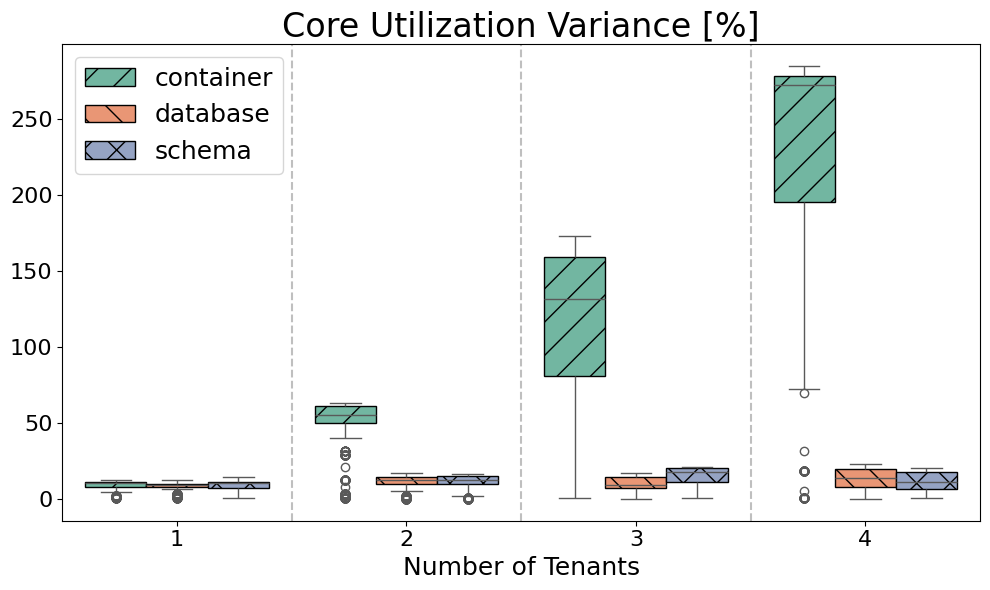

In [16]:
plot_boxplots(df_performance_first, y='value', title=df_metrics.loc[metric]['title'])

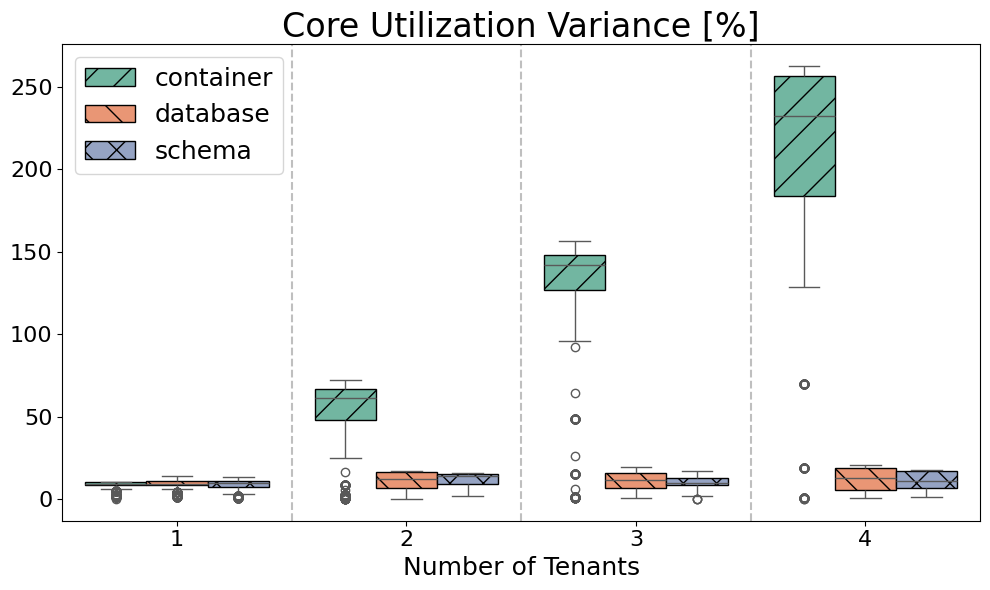

In [17]:
plot_boxplots(df_performance_second, y='value', title=df_metrics.loc[metric]['title'])

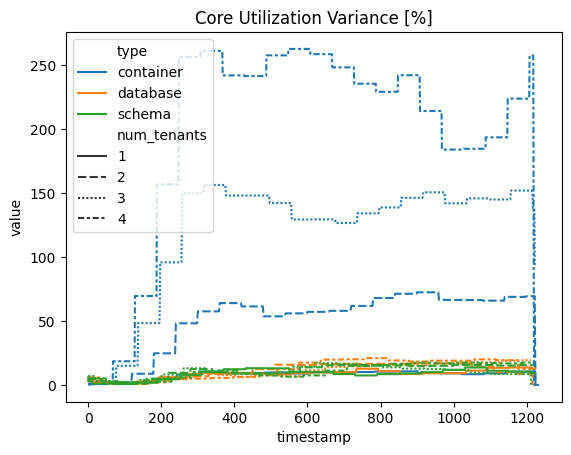

In [18]:
sns.lineplot(
    data=df_performance_second,
    x="timestamp",
    y="value",
    hue="type",             # color by type
    style="num_tenants",    # different line styles per num_tenants
    #markers=True
)
plt.title(df_metrics.loc[metric]['title'])
plt.show()

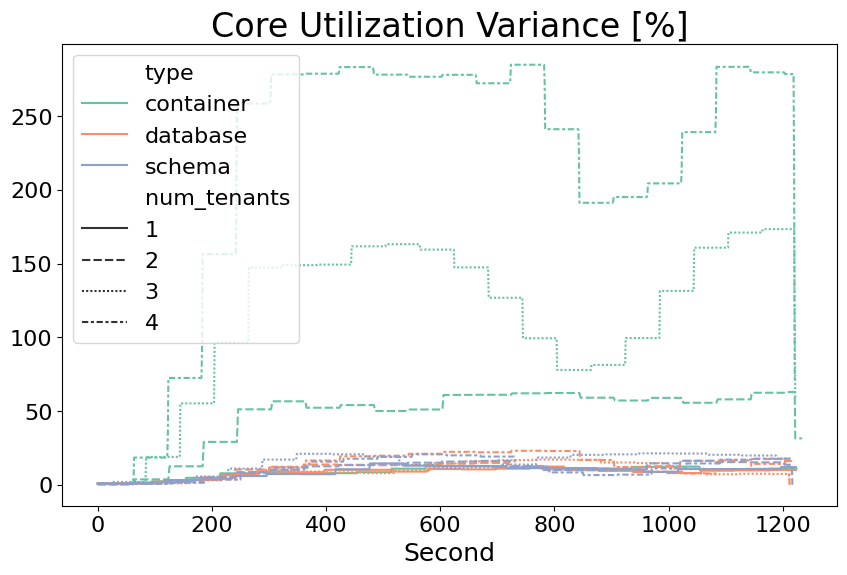

In [19]:
def plot_lines(df, y, title, filename_prefix="plot"):
    plt.figure(figsize=(10, 6))

    # Consistent colors per type
    palette = {
        'container': '#66c2a5',
        'database': '#fc8d62',
        'schema': '#8da0cb'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot lineplot grouped by num_tenants and colored by type

    ax = sns.lineplot(
        data=df.reset_index(),
        x="timestamp",
        y=y,
        hue="type",
        hue_order=hue_order,
        style="num_tenants",          # different line styles per type
        markers=False,          # markers at points
        dashes=True,
        estimator=None,   # plot raw data without aggregation
        errorbar=None,
        #fill=False,         # <- this disables area fill!
        #ci=None,
        palette=palette
    )

    # Axis labels and title
    plt.title(title, fontsize=24)
    plt.xlabel("Second", fontsize=18)
    #plt.ylabel(y, fontsize=18)
    ax.set(ylabel=None)
    ax.tick_params(axis='both', labelsize=16)

    # Legend formatting
    plt.legend(fontsize=16, title_fontsize=18)
    
    # Save
    filename = "tpcc_" + filename_prefix + "_" + title.replace(" ", "_") + ".png"
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

#print("Seaborn version:", sns.__version__)

plot_lines(df_performance_first, y='value', title=df_metrics.loc[metric]['title'])

In [189]:
df_performance = collect.get_monitoring_single_all("stream")
df_performance

,CPU [CPUs],CPU Throttled,Max CPU,Max RAM [Gb],Max RAM Cached [Gb],Locks,Access Exclusive,Access Share,Exclusive,Row Exclusive,...,Sync Time,Write Time,Cache Hit Ratio [%],Number Autoanalyze,Number Autovacuum,Variance of Core Util [%],client,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,20009.97,0.0,19.83,12.71,27.56,1003.38,3.14,328.29,19.31,330.02,...,0.0,0.0,100.00,271.0,203.0,9.01,1,container,1,1755712809
PostgreSQL-1-1-65536-0-2,19021.29,0.0,19.96,17.39,39.48,1004.92,4.04,327.22,19.98,334.92,...,0.0,0.0,100.00,233.0,189.0,8.19,2,container,1,1755712809
PostgreSQL-1-1-65536-1,18789.19,0.0,19.72,12.33,28.35,984.12,3.78,320.49,20.51,327.87,...,0.0,0.0,100.00,289.0,226.0,8.20,1,database,1,1755709687
PostgreSQL-1-1-65536-2,19963.08,0.0,20.97,17.24,38.04,998.08,3.81,325.62,19.71,331.93,...,0.0,0.0,100.00,232.0,188.0,8.67,2,database,1,1755709687
PostgreSQL-1-1-65536-1,20393.69,0.0,22.70,12.23,28.07,979.58,3.64,321.51,20.08,325.10,...,0.0,0.0,100.00,267.0,210.0,8.97,1,schema,1,1755706475
PostgreSQL-1-1-65536-2,18717.36,0.0,20.43,17.23,34.49,1019.80,3.50,334.14,19.00,333.81,...,0.0,0.0,100.00,221.0,185.0,8.69,2,schema,1,1755706475
PostgreSQL-1-1-65536-0-1,18653.12,0.0,18.62,18.30,35.95,1008.36,4.45,328.23,17.46,335.40,...,0.0,0.0,99.91,216.0,183.0,24.03,1,container,2,1755696350
PostgreSQL-1-1-65536-0-2,18455.24,0.0,19.52,24.71,47.64,1001.06,3.85,326.00,17.86,331.07,...,0.0,0.0,98.77,953.0,783.0,26.00,2,container,2,1755696350
PostgreSQL-1-1-65536-1-1,17689.05,0.0,19.54,16.26,38.04,1018.26,6.35,338.27,17.92,328.44,...,0.0,0.0,99.81,215.0,188.0,23.93,1,container,2,1755696350
PostgreSQL-1-1-65536-1-2,18713.50,0.0,19.14,23.23,46.00,1008.81,4.23,330.92,16.95,331.37,...,0.0,0.0,99.92,216.0,195.0,25.98,2,container,2,1755696350


# Monitoring Aggregated Values

In [13]:
df_performance = collect.get_monitoring_all("stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance#[['Max CPU', 'client', 'type', 'num_tenants']]

,client,CPU [CPUs],Max RAM [Gb],Max RAM Cached [Gb],Max CPU,CPU Throttled,Locks,Access Exclusive,Access Share,Exclusive,...,Heap Hits,Sync Time,Write Time,Number Autoanalyze,Number Autovacuum,Cache Hit Ratio [%],Variance of Core Util [%],type,num_tenants,code
0,1,36342.17,34.56,73.99,38.16,0.0,2026.62,10.80,666.50,35.38,...,1.389347e+09,0.0,0.0,431.0,371.0,99.860,24.03,container,2,1755696350
1,2,37168.74,47.94,93.64,38.66,0.0,2009.87,8.08,656.92,34.81,...,3.423106e+09,0.0,0.0,1169.0,978.0,99.345,26.00,container,2,1755696350
0,1,22757.25,22.48,56.56,23.24,0.0,1989.86,7.39,648.62,36.77,...,9.242831e+08,0.0,0.0,402.0,362.0,99.900,11.01,database,2,1755693435
1,2,22993.46,31.16,66.95,24.27,0.0,1991.15,6.97,642.65,37.10,...,7.573223e+08,0.0,0.0,383.0,352.0,99.910,11.32,database,2,1755693435
0,1,22175.03,23.50,66.04,24.94,0.0,1929.35,8.39,624.10,38.36,...,8.562967e+08,0.0,0.0,345.0,324.0,99.860,10.86,schema,2,1755690481
1,2,24096.40,33.01,80.97,23.75,0.0,1894.99,6.08,614.89,36.80,...,9.555812e+08,0.0,0.0,345.0,330.0,99.880,11.46,schema,2,1755690481


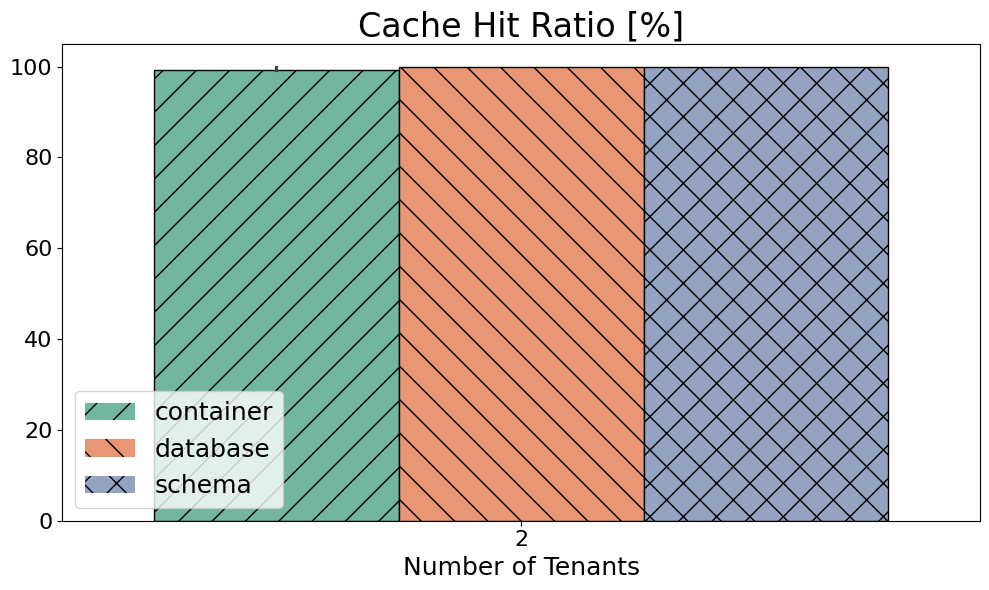

In [14]:
plot_bars(df_performance.fillna(0), y='Cache Hit Ratio [%]', title='Cache Hit Ratio [%]', estimator='min')

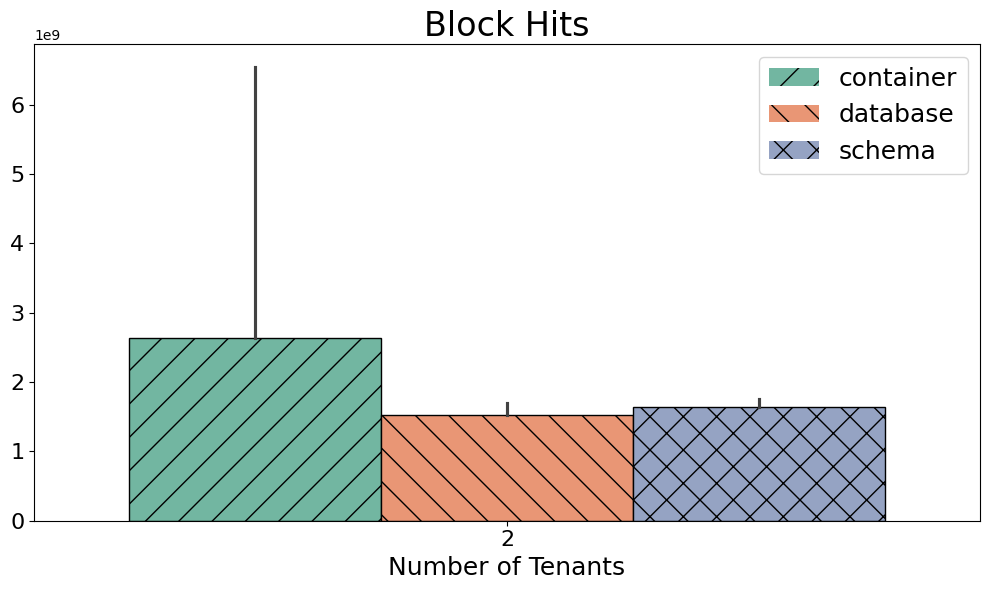

In [15]:
plot_bars(df_performance, y='Block Hits', title='Block Hits', estimator='min')

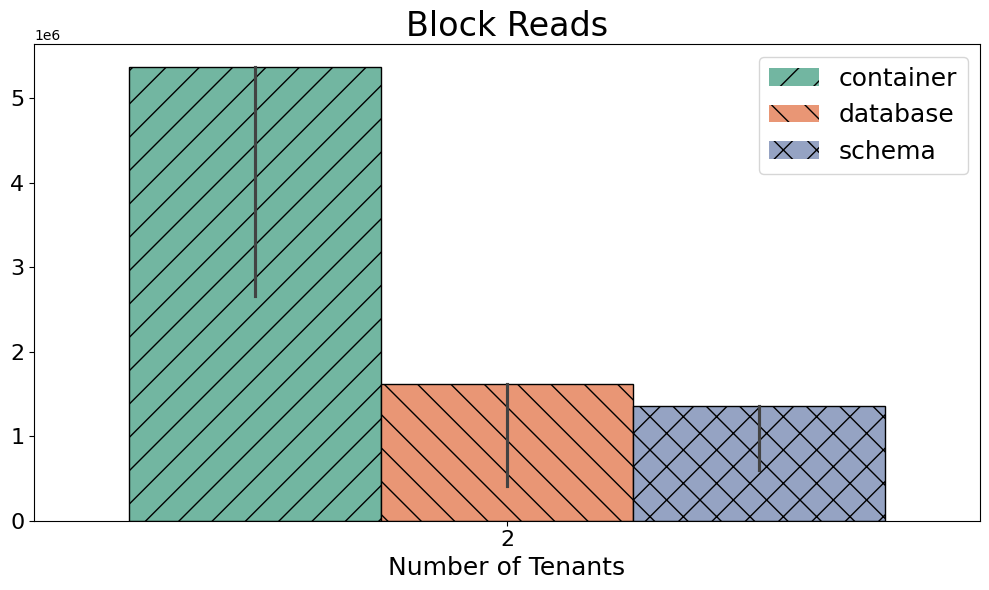

In [16]:
plot_bars(df_performance, y='Block Reads', title='Block Reads', estimator='max')

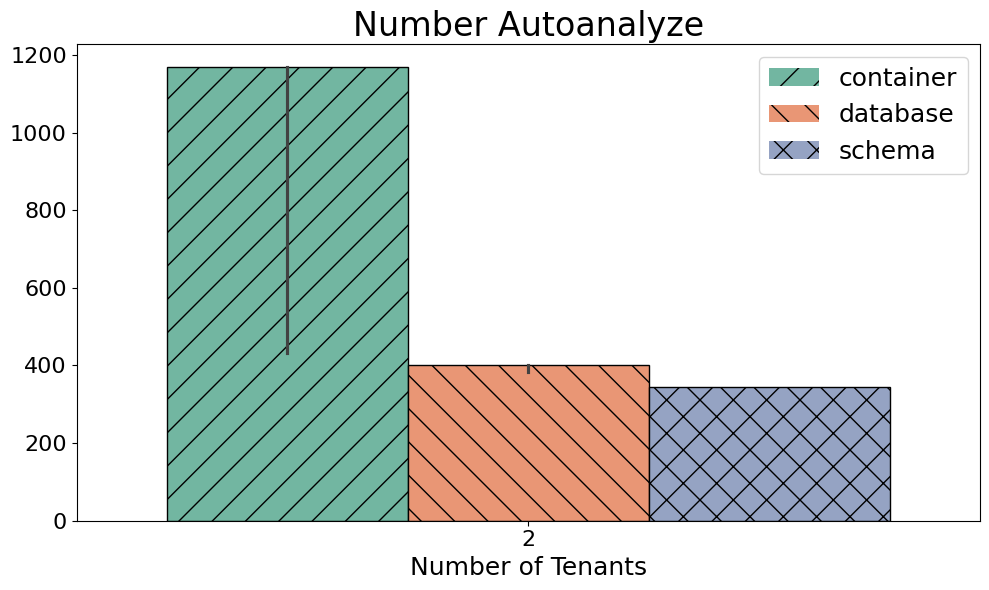

In [17]:
plot_bars(df_performance, y='Number Autoanalyze', title='Number Autoanalyze', estimator='max')

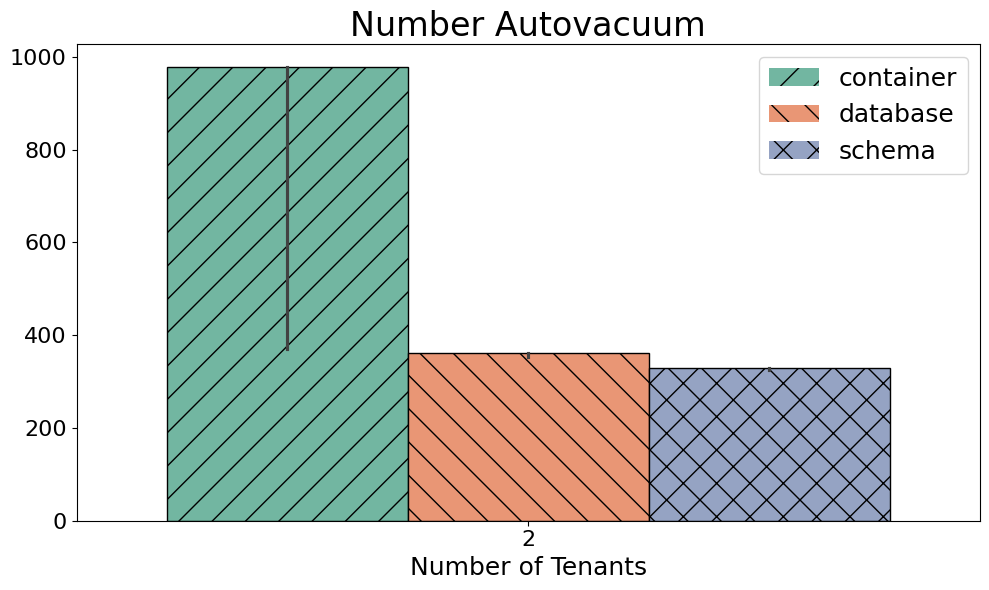

In [18]:
plot_bars(df_performance, y='Number Autovacuum', title='Number Autovacuum', estimator='max')

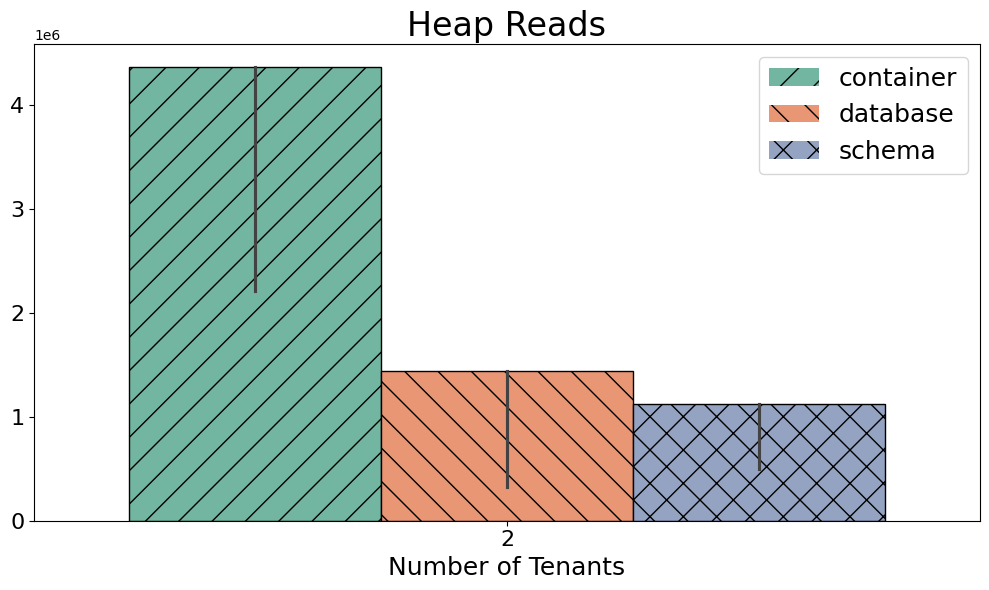

In [19]:
plot_bars(df_performance, y='Heap Reads', title='Heap Reads', estimator='max')

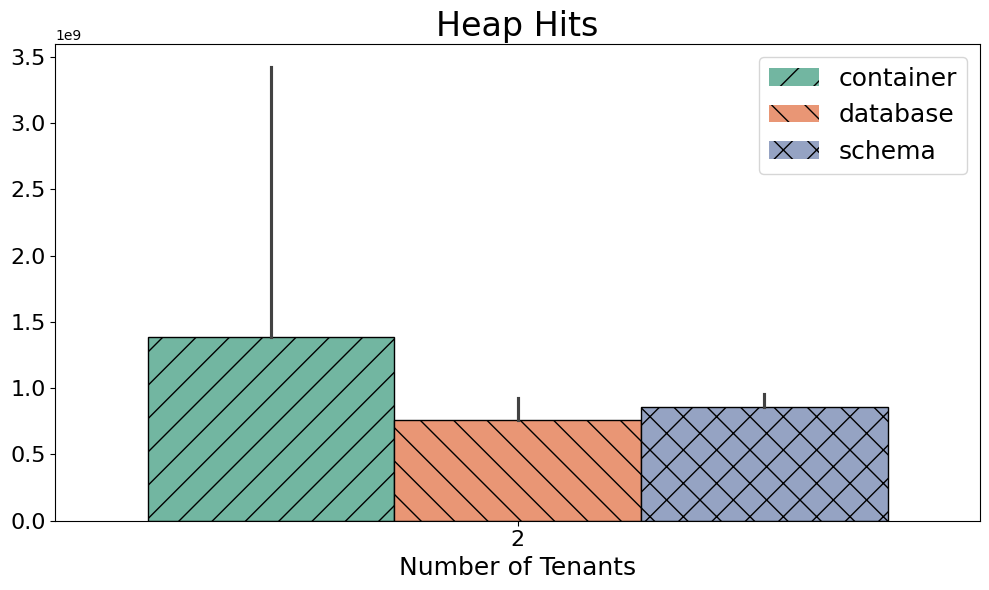

In [20]:
plot_bars(df_performance, y='Heap Hits', title='Heap Hits', estimator='min')

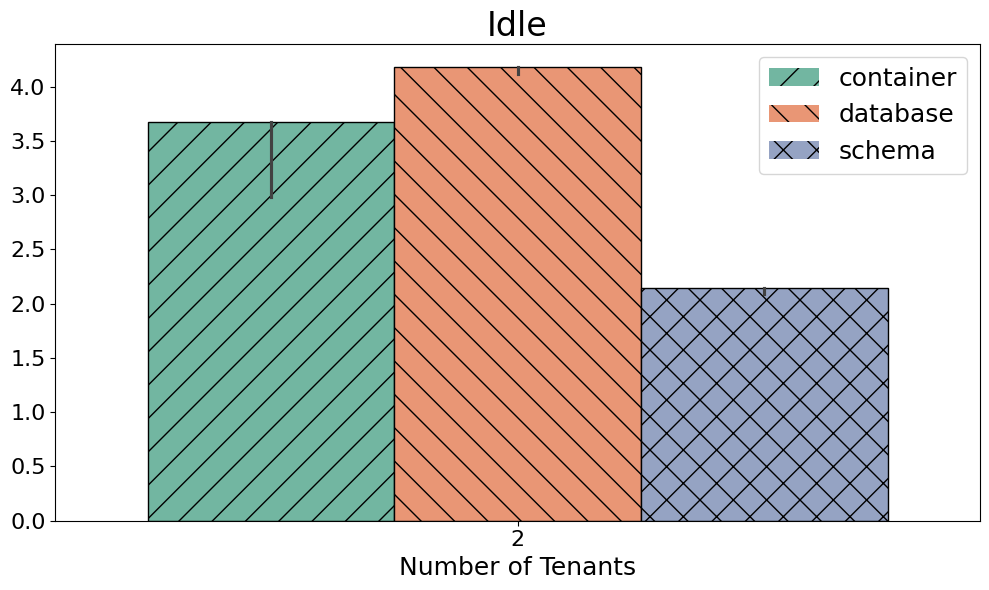

In [21]:
plot_bars(df_performance, y='Idle', title='Idle', estimator='max')

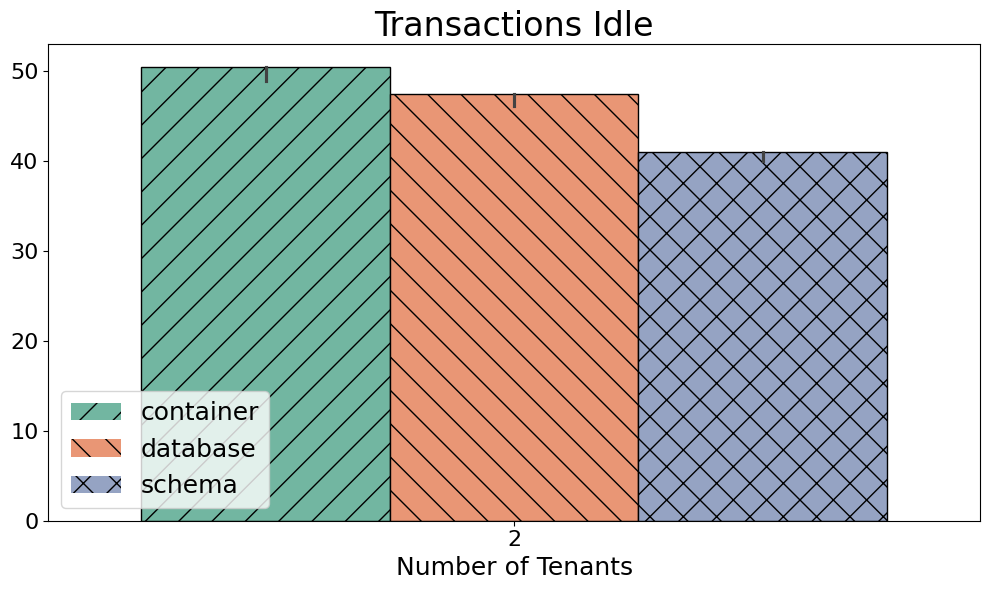

In [22]:
plot_bars(df_performance, y='Transactions Idle', title='Transactions Idle', estimator='max')

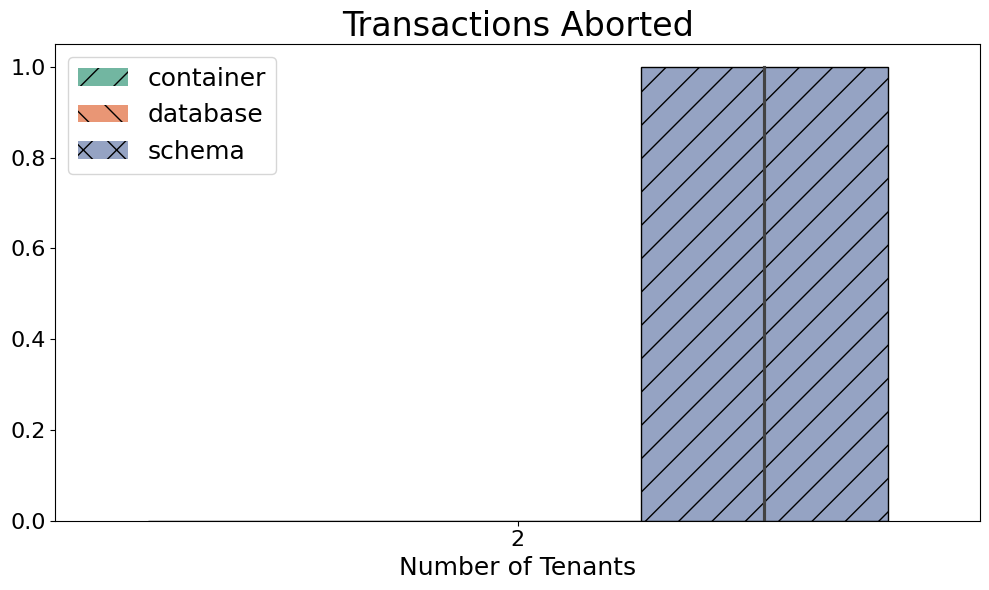

In [23]:
plot_bars(df_performance, y='Transactions Aborted', title='Transactions Aborted', estimator='max')

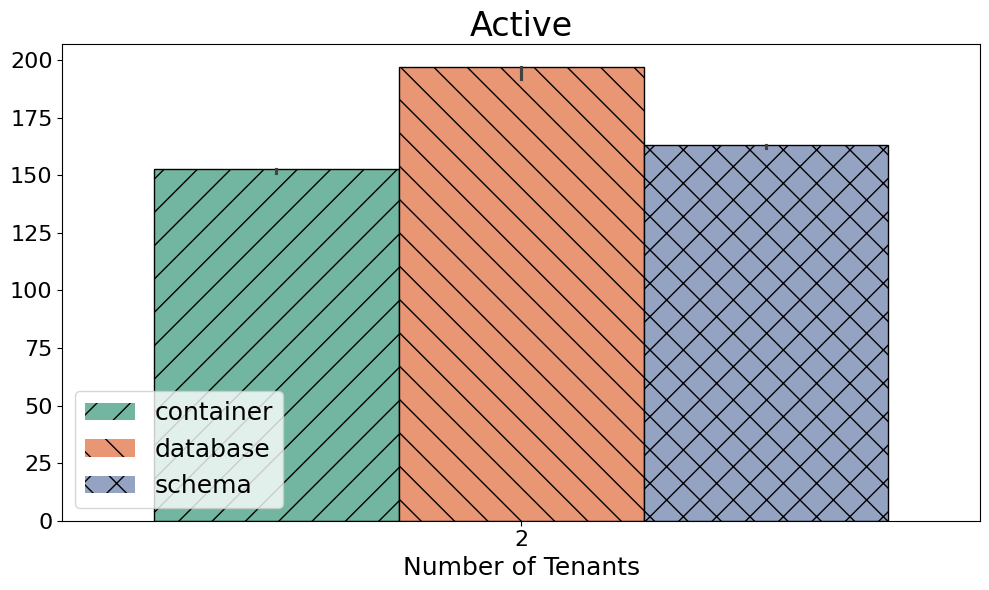

In [24]:
plot_bars(df_performance, y='Active', title='Active', estimator='max')

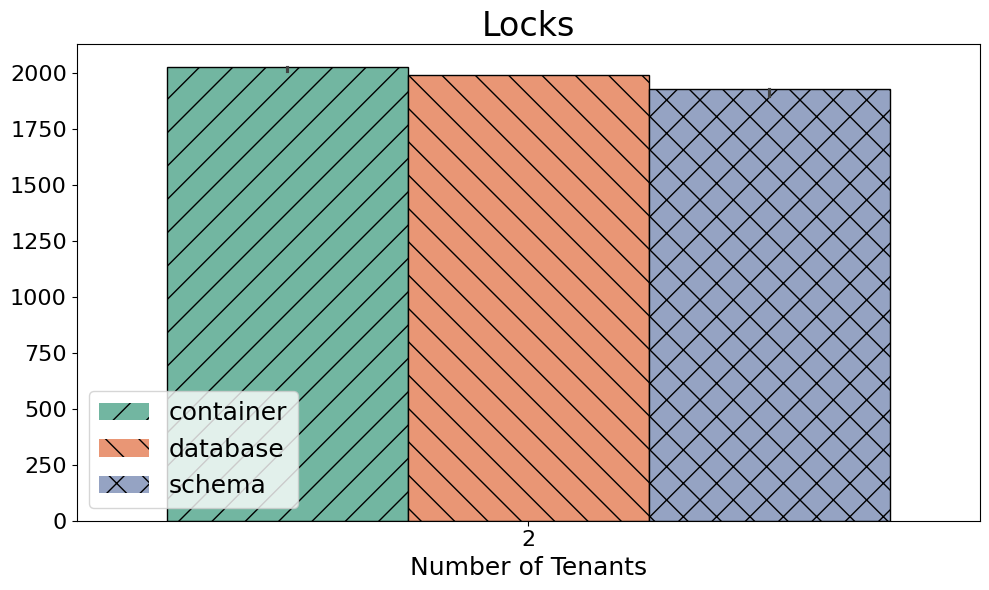

In [25]:
plot_bars(df_performance, y='Locks', title='Locks', estimator='max')

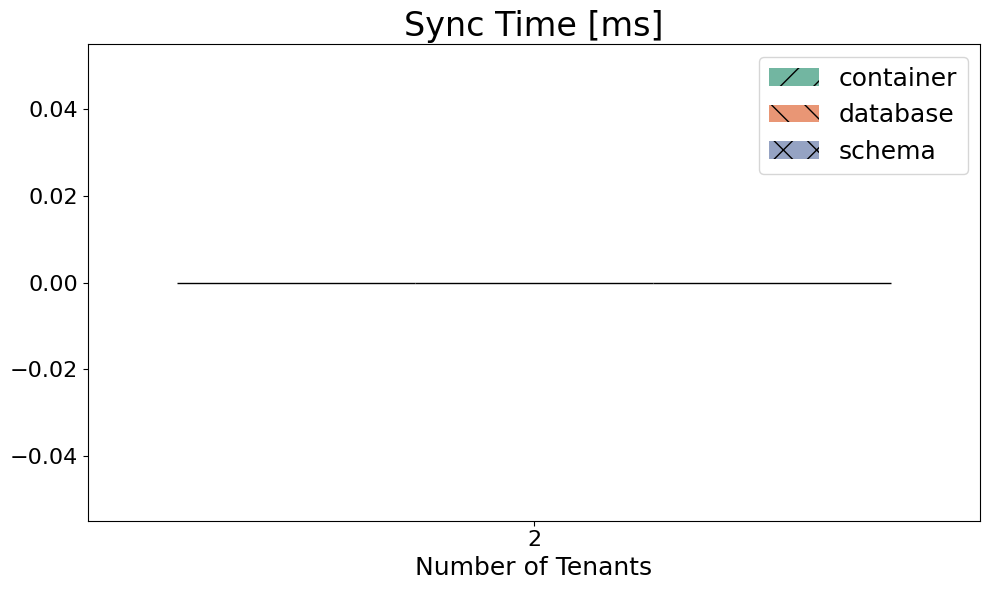

In [26]:
plot_bars(df_performance, y='Sync Time', title='Sync Time [ms]', estimator='max')

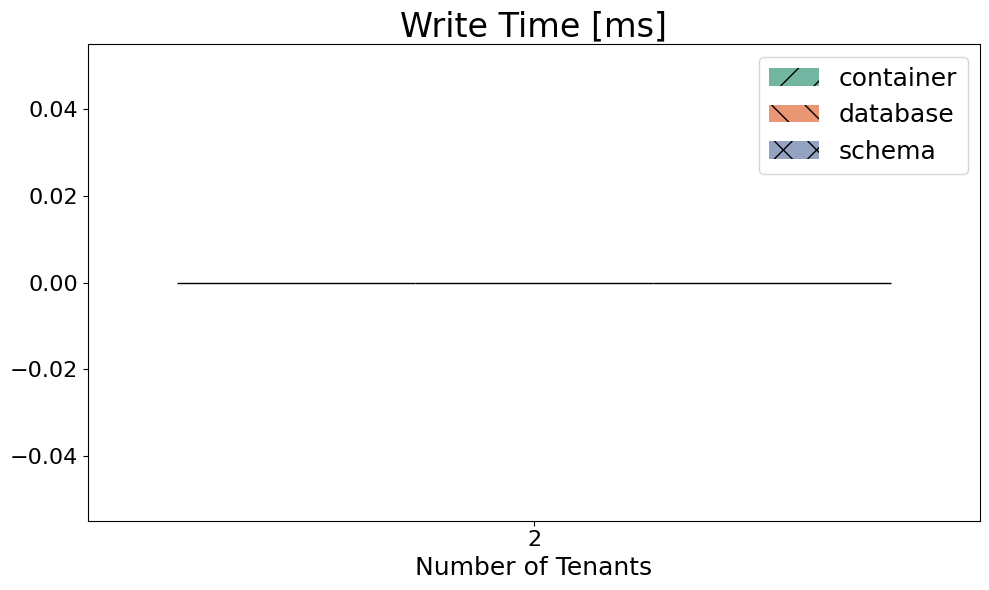

In [27]:
plot_bars(df_performance, y='Write Time', title='Write Time [ms]', estimator='max')

In [28]:
#plot_bars(df_performance, y='Variance of Core Util [%]', title='Variance of Core Util [%]', estimator='max')

# Performance Results per Tenant

In [20]:
df_performance = collect.get_performance_all_single()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,connection,configuration,experiment_run,client,pod,pod_count,bench,profile,target,time,...,Latency Distribution.Median Latency (microseconds),Latency Distribution.Minimum Latency (microseconds),Latency Distribution.25th Percentile Latency (microseconds),Latency Distribution.90th Percentile Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),Latency Distribution.75th Percentile Latency (microseconds),Latency Distribution.Average Latency (microseconds),type,num_tenants,code
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,xr4bd.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,11394,594,7671,27115,335879,17420,21930,container,1,1755712809
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,hfxk5.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,11543,623,7870,26247,375195,16982,22645,container,1,1755712809
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,fmcqw.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,12069,645,8332,26268,358411,17308,23153,database,1,1755709687
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,72w5b.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,11692,658,7968,26818,381814,17297,22537,database,1,1755709687
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,pwcrh.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,11369,604,7744,26360,308980,16743,22272,schema,1,1755706475
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,d2g52.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,12165,600,8232,27533,361689,18197,23327,schema,1,1755706475
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,7fk6r.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,13327,611,8624,35756,334549,21100,26154,container,2,1755696350
PostgreSQL-1-1-65536-1-1-1,PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,1,1,29rrc.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,13180,614,8510,36958,311812,21274,26289,container,2,1755696350
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,pjppf.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,13594,643,8797,36558,295503,21477,26072,container,2,1755696350


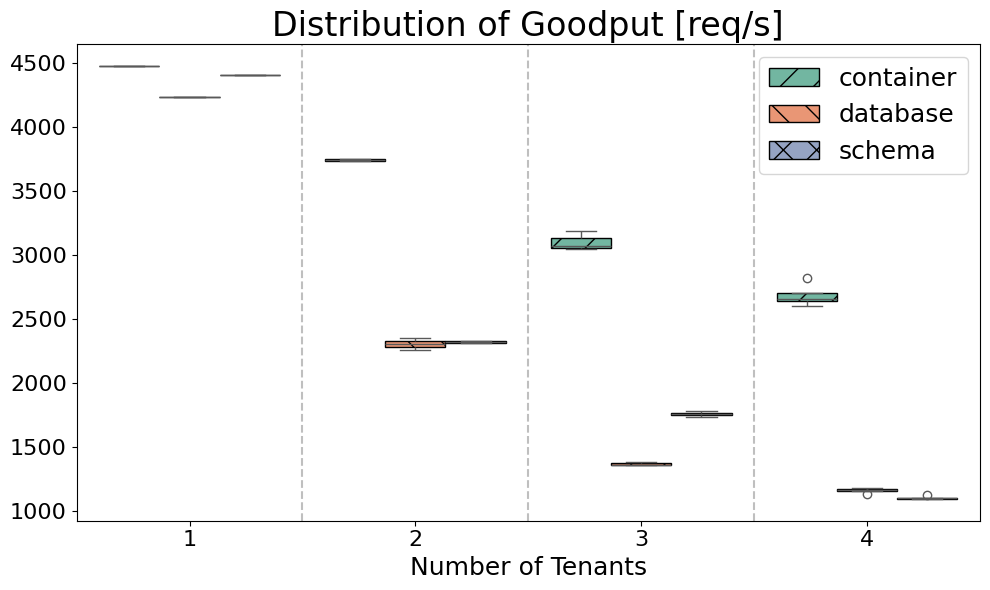

In [21]:
plot_boxplots(df_performance_first, y='Goodput (requests/second)', title='Distribution of Goodput [req/s]')

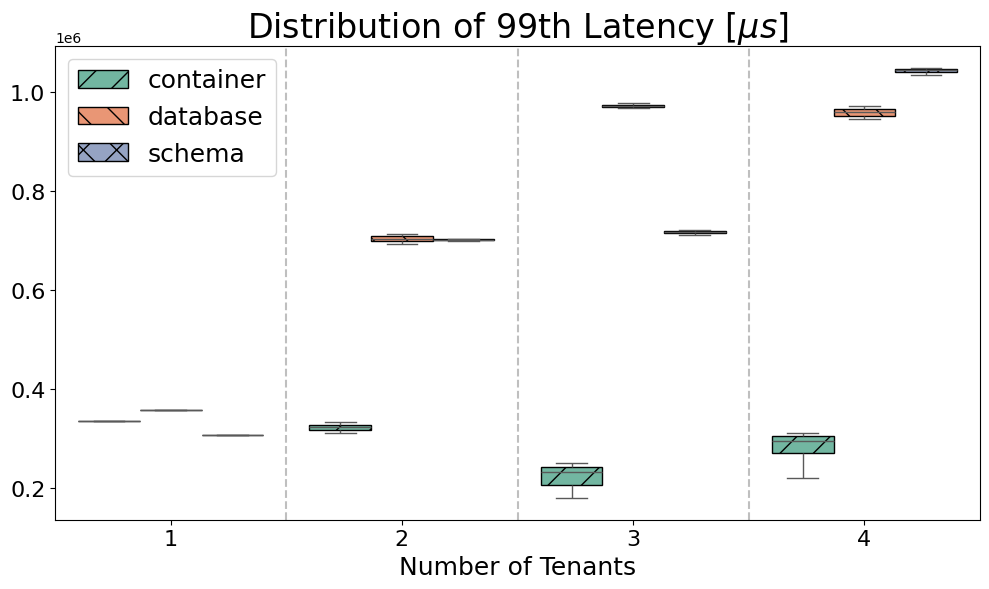

In [22]:
plot_boxplots(df_performance_first, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency [$\mu s$]')

# Performance Results per Total

In [23]:
df_performance = collect.get_performance_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.dropna(inplace=True)

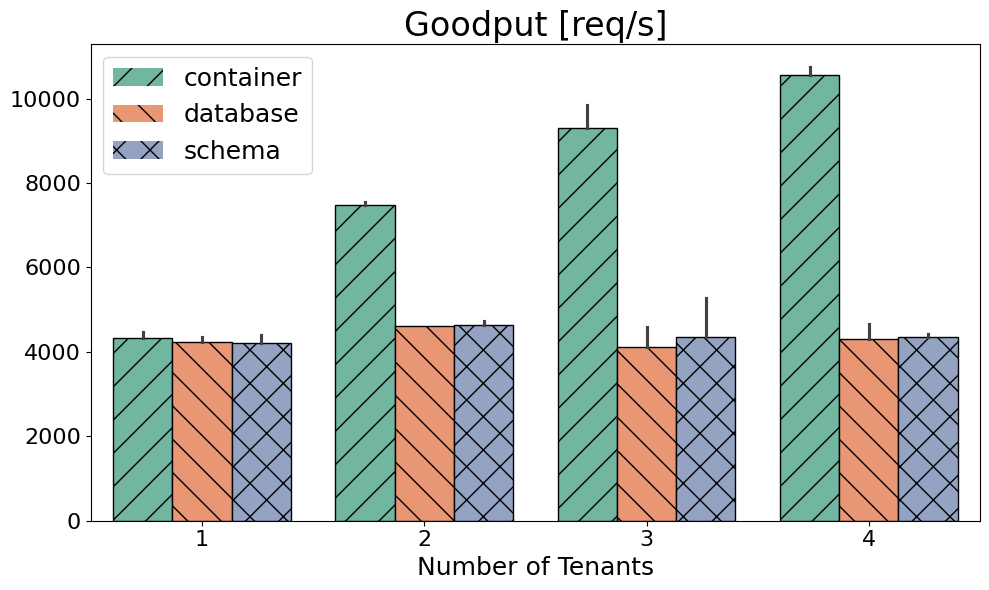

In [24]:
plot_bars(df_performance, y='Goodput (requests/second)', title='Goodput [req/s]', estimator='min')

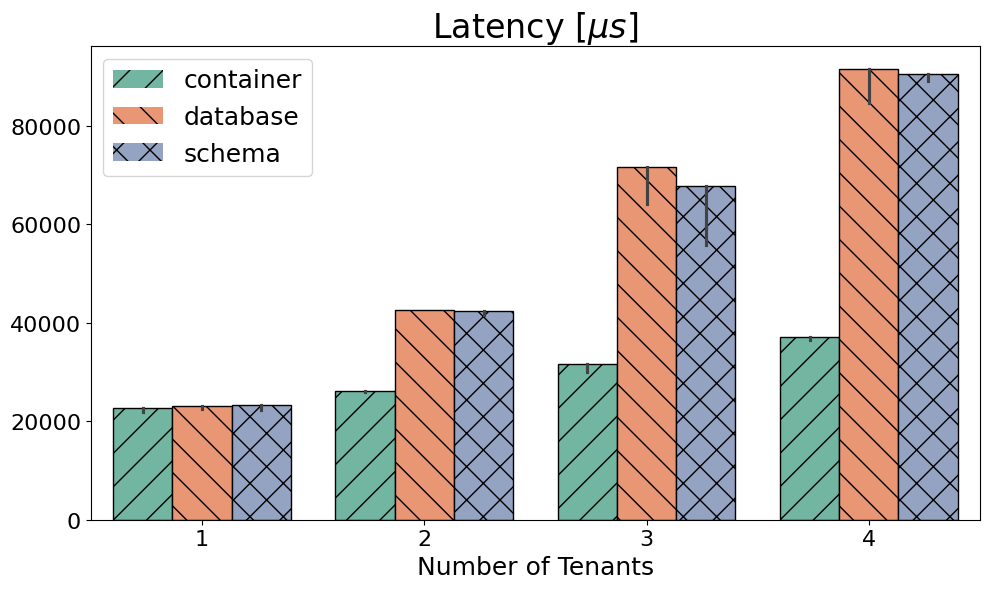

In [25]:
plot_bars(df_performance, y='Latency Distribution.Average Latency (microseconds)', title='Latency [$\mu s$]', estimator='max')

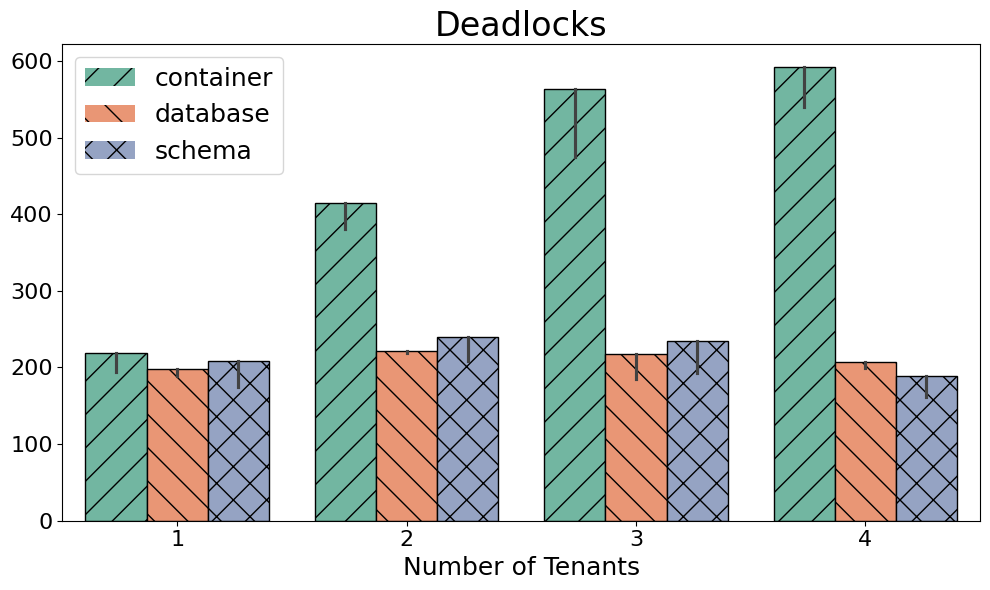

In [26]:
plot_bars(df_performance, y='num_errors', title='Deadlocks', estimator='max')

In [27]:
df_performance = collect.get_loading_time_max_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,time_load,time_ingest,time_check,terminals,pods,tenant,client,datadisk,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,318.0,128.0,186.0,1,1,0,1,3056,container,1,1755712809
PostgreSQL-1-1-65536-0-2,318.0,128.0,186.0,1,1,0,2,9431,container,1,1755712809
PostgreSQL-1-1-65536-1,315.0,124.0,187.0,1,1,,1,3064,database,1,1755709687
PostgreSQL-1-1-65536-2,315.0,124.0,187.0,1,1,,2,9710,database,1,1755709687
PostgreSQL-1-1-65536-1,323.0,126.0,193.0,1,1,,1,3056,schema,1,1755706475
PostgreSQL-1-1-65536-2,323.0,126.0,193.0,1,1,,2,10568,schema,1,1755706475
PostgreSQL-1-1-65536-0-1,363.0,150.0,211.0,1,1,0,1,10229,container,2,1755696350
PostgreSQL-1-1-65536-0-2,363.0,150.0,211.0,1,1,0,2,15100,container,2,1755696350
PostgreSQL-1-1-65536-1-1,355.0,146.0,206.0,1,1,1,1,10573,container,2,1755696350
PostgreSQL-1-1-65536-1-2,355.0,146.0,206.0,1,1,1,2,19228,container,2,1755696350


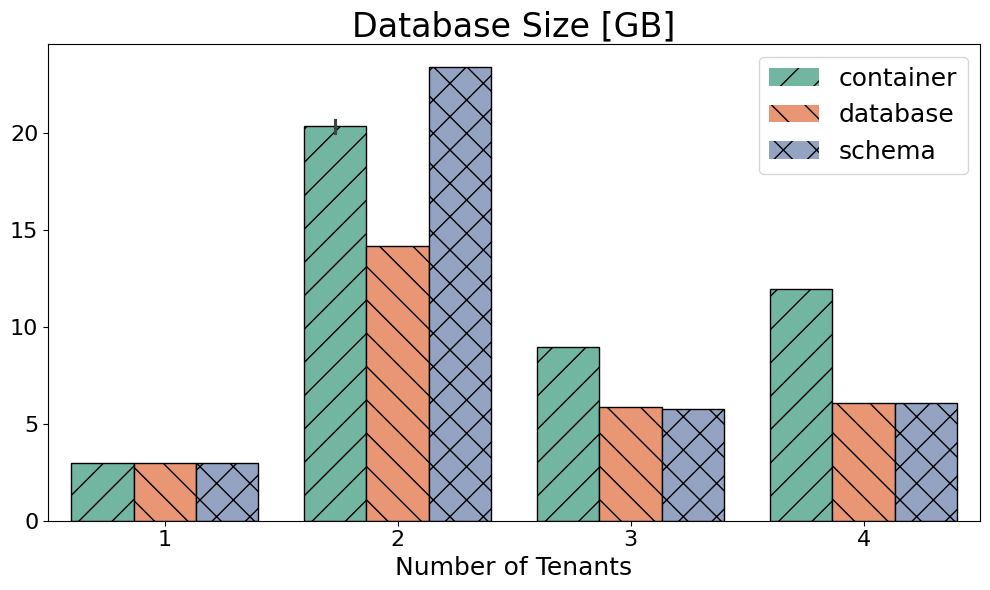

In [28]:
df_performance_first = df_performance[df_performance['client'] == '1']
# Divide datadisk by the count of rows with the same type and num_tenants
df = df_performance_first.copy()
# Create a mask for rows where type is not "container"
mask = df['type'] != 'container'

# Only apply the group count to the relevant rows
group_counts = df[mask].groupby(['type', 'num_tenants'])['datadisk'].transform('count')

# Initialize the column with NaN (or 0, if preferred)
df['datadisk_normalized'] = df['datadisk'] / 1024

# Apply the normalized value only where the mask is True
df.loc[mask, 'datadisk_normalized'] = df.loc[mask, 'datadisk'] / group_counts / 1024

plot_bars(df, y='datadisk_normalized', title='Database Size [GB]', estimator='sum')

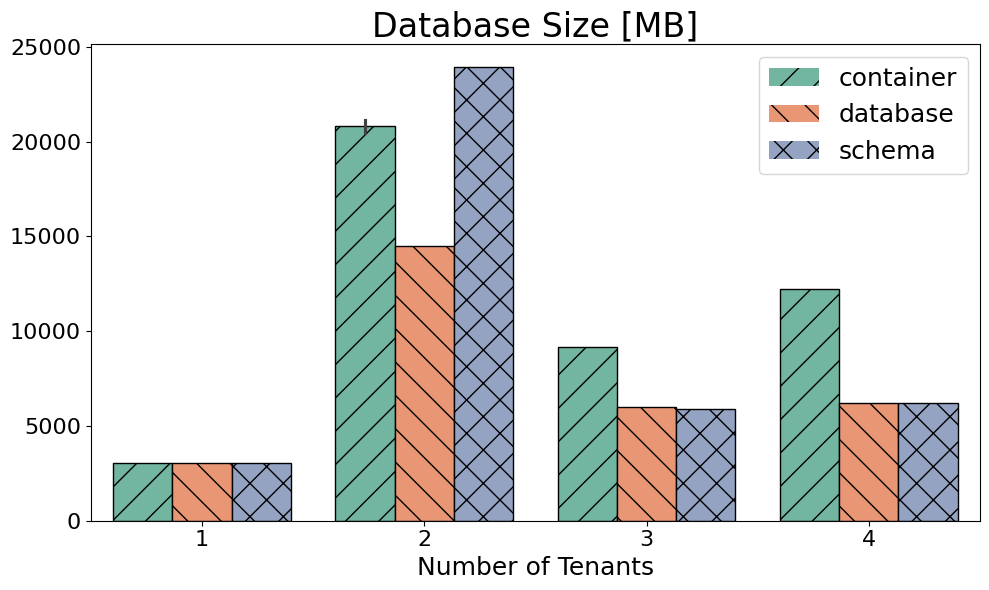

In [29]:
plot_bars(df_performance_first, y='datadisk', title='Database Size [MB]', estimator='sum')

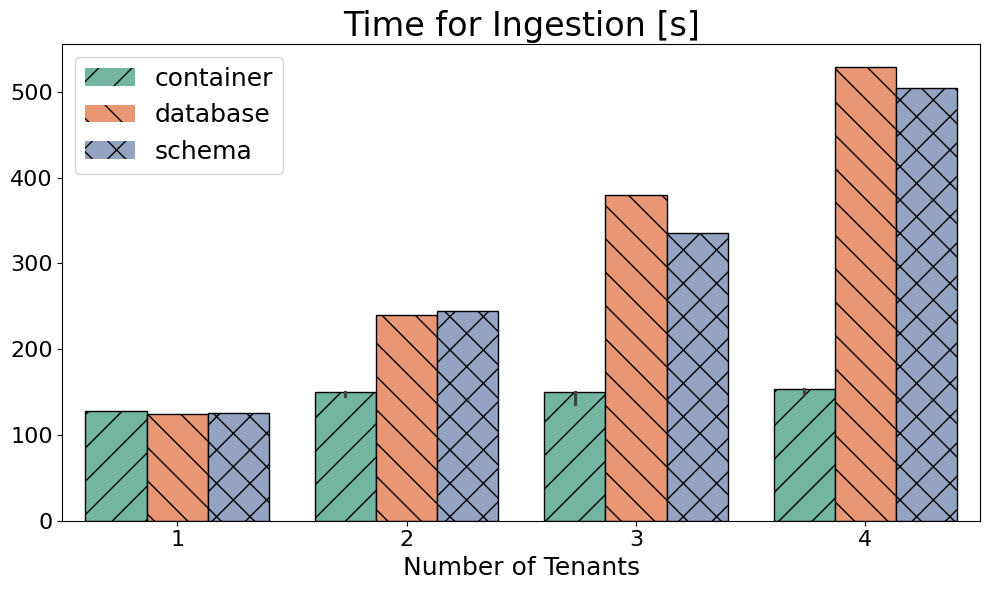

In [30]:
plot_bars(df_performance_first, y='time_ingest', title='Time for Ingestion [s]', estimator='max')

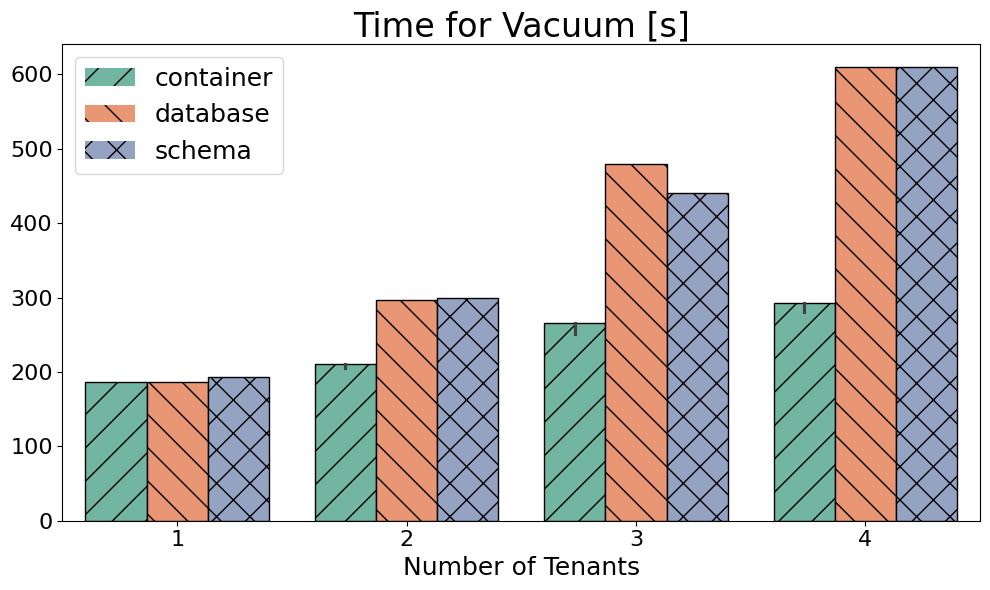

In [31]:
plot_bars(df_performance_first, y='time_check', title='Time for Vacuum [s]', estimator='max')

# Hardware Monitoring for Benchmarking Phase

In [32]:
df_performance = collect.get_monitoring_all(type="stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
CPU [CPUs],20009.97,19021.29,18789.19,19963.08,20393.69,18717.36,36342.17,37168.74,22757.25,22993.46,...,22249.87,23160.28,28303.94,23075.85,55863.03,52194.26,25169.08,23826.08,23836.72,23788.51
Max RAM [Gb],12.71,17.39,12.33,17.24,12.23,17.23,34.56,47.94,22.48,31.16,...,18.53,24.22,20.4,26.37,42.05,53.3,22.57,28.24,22.6,28.32
Max RAM Cached [Gb],27.56,39.48,28.35,38.04,28.07,34.49,73.99,93.64,56.56,66.95,...,41.19,54.94,52.38,58.4,80.37,101.91,52.24,61.25,50.5,61.34
Max CPU,19.83,19.96,19.72,20.97,22.7,20.43,38.16,38.66,23.24,24.27,...,24.94,26.3,28.63,27.62,56.94,57.0,28.34,29.26,28.45,25.81
CPU Throttled,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Locks,1003.38,1004.92,984.12,998.08,979.58,1019.8,2026.62,2009.87,1989.86,1991.15,...,2903.08,2779.19,2875.41,2863.21,4042.27,3871.78,3637.91,3743.67,3607.32,3567.27
Access Exclusive,3.14,4.04,3.78,3.81,3.64,3.5,10.8,8.08,7.39,6.97,...,8.96,8.56,8.97,8.72,18.84,13.13,10.28,11.35,9.04,8.44
Access Share,328.29,327.22,320.49,325.62,321.51,334.14,666.5,656.92,648.62,642.65,...,936.57,895.69,925.53,916.41,1339.19,1271.39,1155.04,1197.22,1142.68,1135.98
Exclusive,19.31,19.98,20.51,19.71,20.08,19.0,35.38,34.81,36.77,37.1,...,52.36,53.68,50.35,53.41,53.07,53.78,68.55,68.93,69.33,72.36


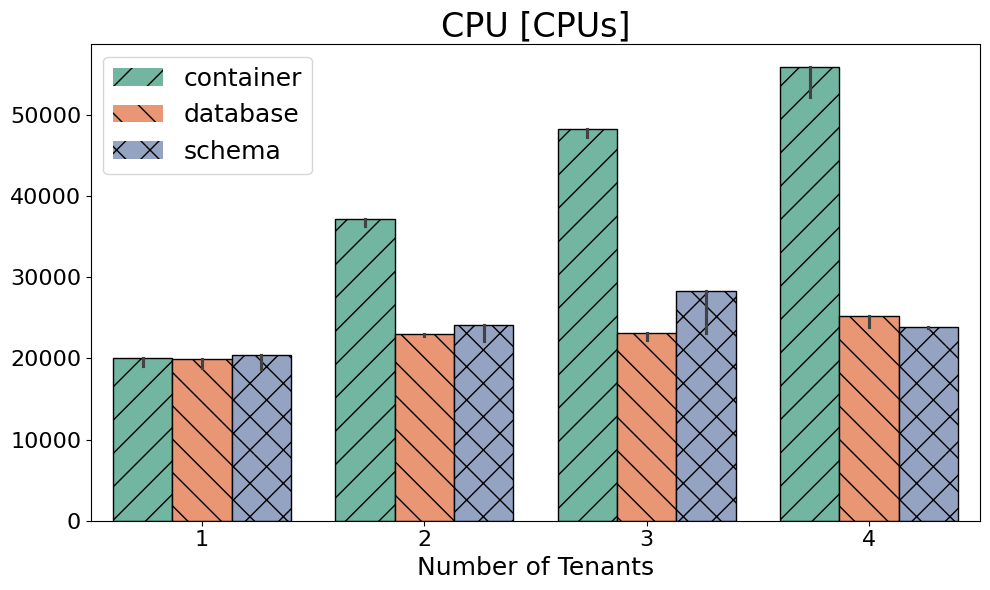

In [33]:
plot_bars(df_performance, y='CPU [CPUs]', title='CPU [CPUs]', estimator='max')

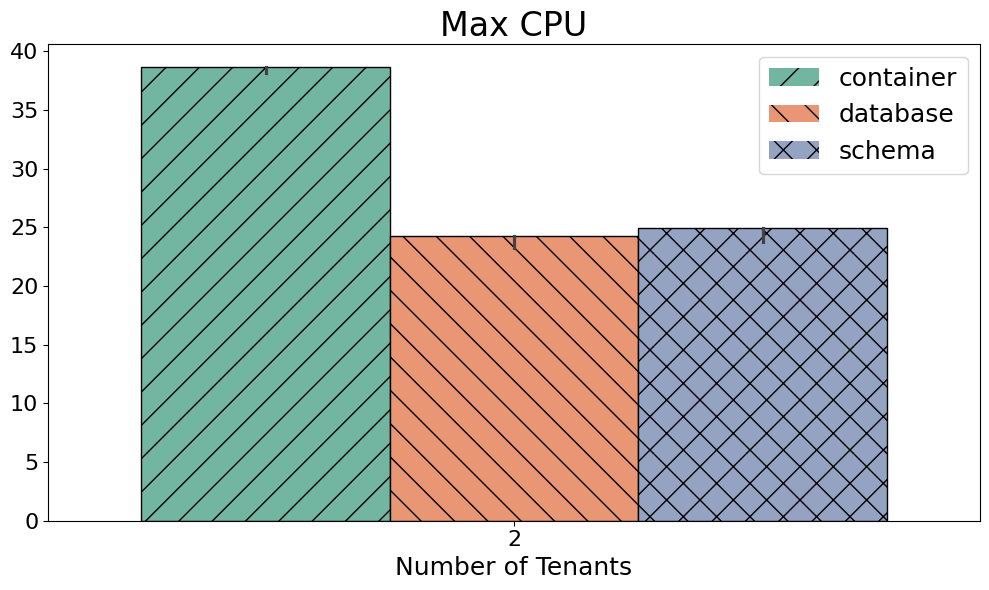

In [43]:
plot_bars(df_performance, y='Max CPU', title='Max CPU', estimator='max')

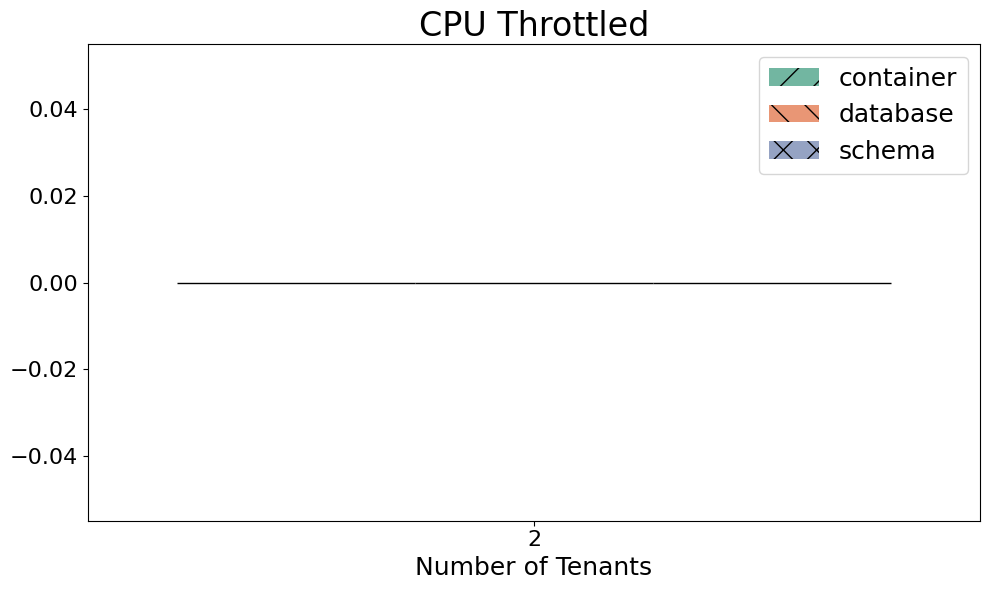

In [44]:
plot_bars(df_performance, y='CPU Throttled', title='CPU Throttled', estimator='max')

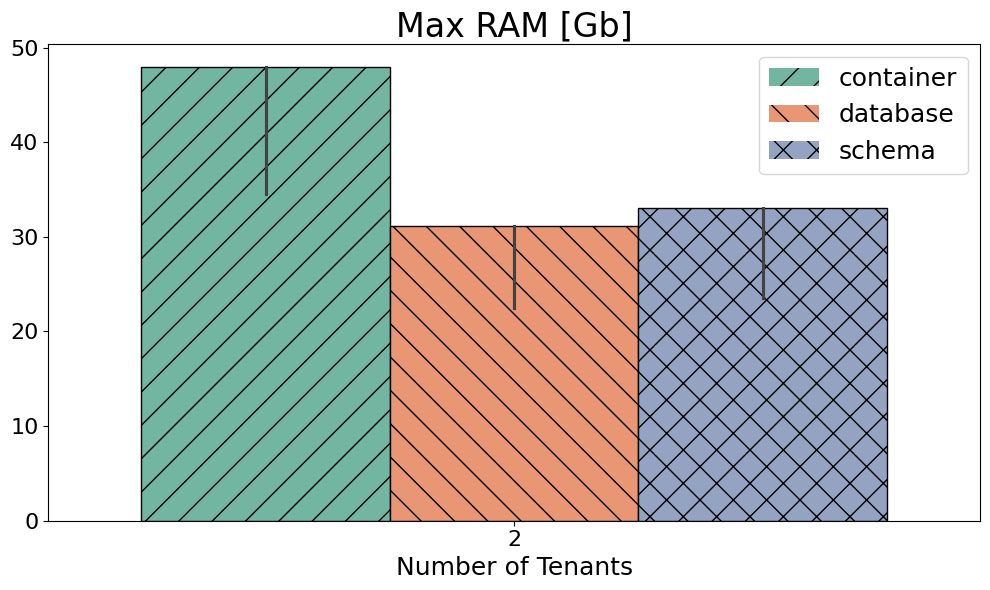

In [45]:
plot_bars(df_performance, y='Max RAM [Gb]', title='Max RAM [Gb]', estimator='max')

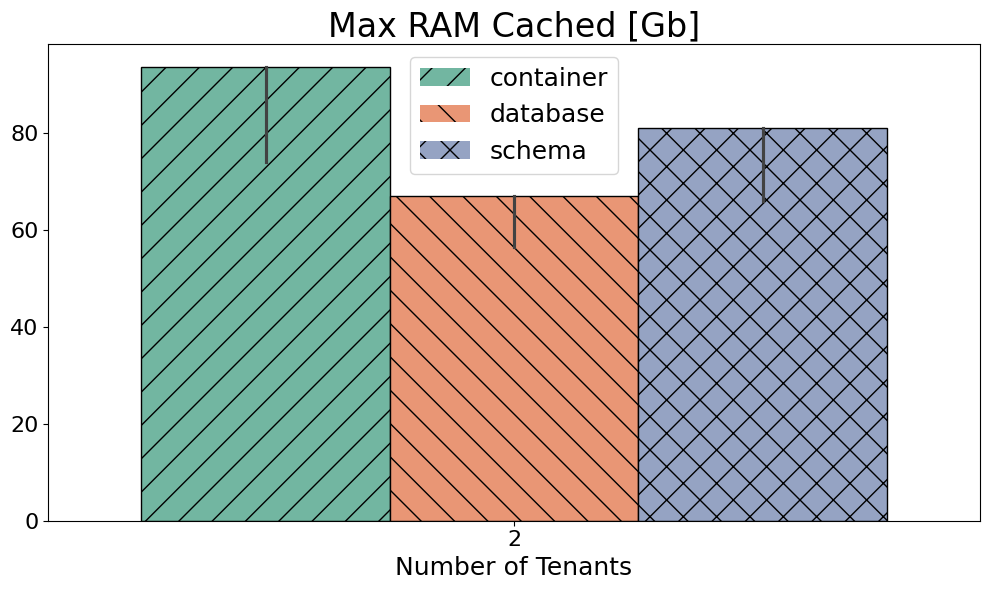

In [46]:
plot_bars(df_performance, y='Max RAM Cached [Gb]', title='Max RAM Cached [Gb]', estimator='max')

# Hardware Monitoring for Loading Phase

In [34]:
df_performance = collect.get_monitoring_all("loading")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

1755696350 None
1755693435 None
1755690481 None


,client,CPU [CPUs],Max RAM [Gb],Max RAM Cached [Gb],Max CPU,CPU Throttled,Locks,Access Exclusive,Access Share,Exclusive,...,Heap Hits,Sync Time,Write Time,Number Autoanalyze,Number Autovacuum,Cache Hit Ratio [%],Variance of Core Util [%],type,num_tenants,code
0,1,473.61,6.59,9.57,4.92,0.0,21.66,0.00,2.24,0.00,...,48490297.0,0.0,0.0,18.0,17.0,99.810000,0.42,container,1,1755712809
1,2,473.61,6.59,9.57,4.92,0.0,21.66,0.00,2.24,0.00,...,48490297.0,0.0,0.0,18.0,17.0,99.810000,0.42,container,1,1755712809
0,1,450.59,6.53,9.52,4.07,0.0,20.37,0.00,2.28,0.00,...,41811505.0,0.0,0.0,16.0,15.0,99.830000,0.37,database,1,1755709687
1,2,450.59,6.53,9.52,4.07,0.0,20.37,0.00,2.28,0.00,...,41811505.0,0.0,0.0,16.0,15.0,99.830000,0.37,database,1,1755709687
0,1,532.60,6.43,9.41,4.59,0.0,20.77,0.00,2.43,0.05,...,77244666.0,0.0,0.0,17.0,16.0,99.780000,0.47,schema,1,1755706475
1,2,532.60,6.43,9.41,4.59,0.0,20.77,0.00,2.43,0.05,...,77244666.0,0.0,0.0,17.0,16.0,99.780000,0.47,schema,1,1755706475
0,1,1342.67,19.49,28.43,10.28,0.0,48.03,0.00,6.16,0.08,...,122392023.0,0.0,0.0,49.0,45.0,99.776667,1.45,container,3,1755723522
1,2,1342.67,19.49,28.43,10.28,0.0,48.03,0.00,6.16,0.08,...,122392023.0,0.0,0.0,49.0,45.0,99.776667,1.45,container,3,1755723522
0,1,1567.44,8.71,15.49,6.64,0.0,82.38,0.02,3.15,0.09,...,124112800.0,0.0,0.0,97.0,87.0,99.930000,0.79,database,3,1755720064
1,2,1567.44,8.71,15.49,6.64,0.0,82.38,0.02,3.15,0.09,...,124112800.0,0.0,0.0,97.0,87.0,99.930000,0.79,database,3,1755720064


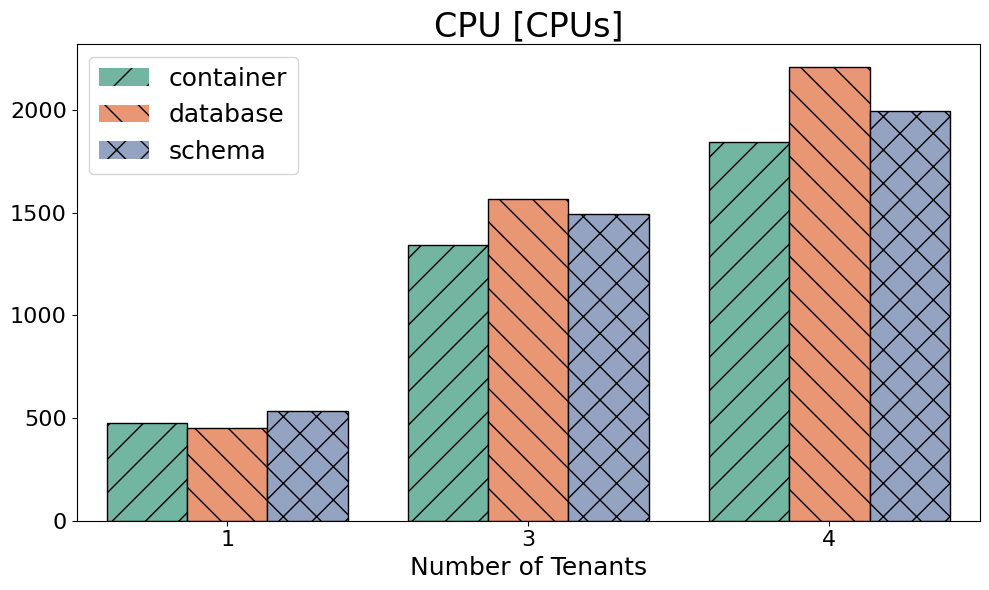

In [35]:
plot_bars(df_performance, y='CPU [CPUs]', title='CPU [CPUs]', estimator='max')

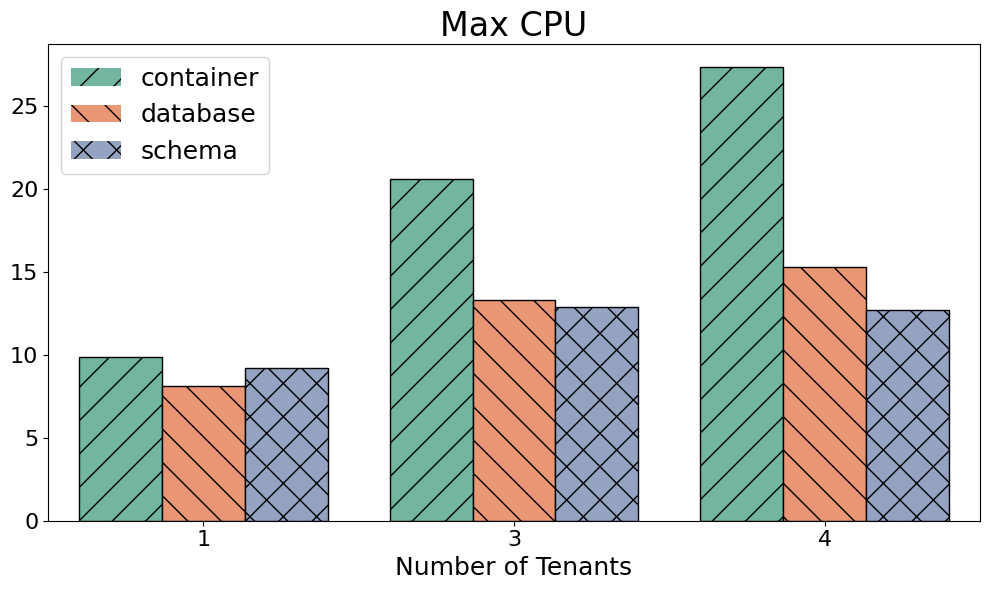

In [36]:
plot_bars(df_performance, y='Max CPU', title='Max CPU', estimator='sum')

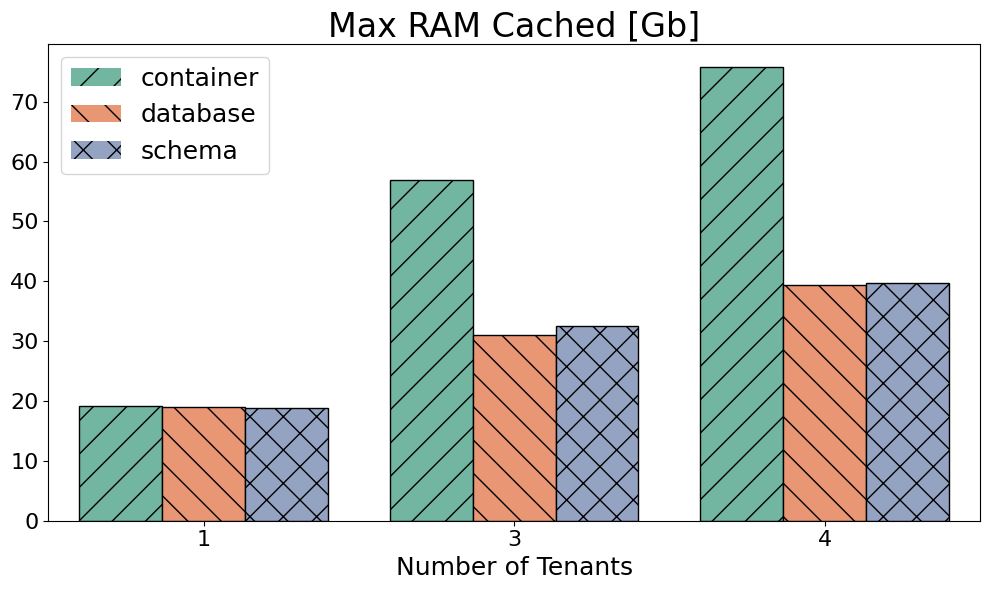

In [37]:
plot_bars(df_performance, y='Max RAM Cached [Gb]', title='Max RAM Cached [Gb]', estimator='sum')

# Efficiency

In [38]:
client = '1'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['I_Lat'] = 1./merged_df['E_Lat']
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU [CPUs]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU [CPUs]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Max RAM [Gb]']
merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,CPU [CPUs],Max RAM [Gb],...,Heap Hits,Sync Time,Write Time,Number Autoanalyze,Number Autovacuum,Cache Hit Ratio [%],Variance of Core Util [%],E_Tpx,E_Lat,E_RAM
0,1,4477.087305,219,21930.000000,335879,container,1,1755712809,20009.97,12.71,...,8.152545e+08,0.0,0.0,271.0,203.0,100.000000,9.01,134.245698,0.047737,352.249198
1,1,4237.045680,198,23153.000000,358411,database,1,1755709687,18789.19,12.33,...,8.061413e+08,0.0,0.0,289.0,226.0,100.000000,8.20,135.302661,0.047945,343.637119
2,1,4407.490708,175,22272.000000,308980,schema,1,1755706475,20393.69,12.23,...,8.118734e+08,0.0,0.0,267.0,210.0,100.000000,8.97,129.672189,0.046922,360.383541
3,1,7486.300520,415,26221.500000,334549,container,2,1755696350,36342.17,34.56,...,1.389347e+09,0.0,0.0,431.0,371.0,99.860000,24.03,123.596921,0.032394,216.617492
4,1,4612.628209,222,42607.500000,714583,database,2,1755693435,22757.25,22.48,...,9.242831e+08,0.0,0.0,402.0,362.0,99.900000,11.01,121.612977,0.032114,205.188088
5,1,4645.543978,209,42299.500000,704003,schema,2,1755690481,22175.03,23.50,...,8.562967e+08,0.0,0.0,345.0,324.0,99.860000,10.86,125.696623,0.032651,197.682722
6,1,9306.547874,475,31675.666667,251642,container,3,1755723522,47265.38,33.07,...,1.712155e+09,0.0,0.0,798.0,604.0,99.726667,38.68,118.139931,0.025844,281.419651
7,1,4113.870683,185,71691.000000,978490,database,3,1755720064,22249.87,18.53,...,6.587947e+08,0.0,0.0,672.0,529.0,100.000000,9.74,110.936487,0.025038,222.011370
8,1,5279.808113,234,55856.666667,721310,schema,3,1755716684,28303.94,20.40,...,1.000234e+09,0.0,0.0,627.0,513.0,100.000000,14.68,111.923812,0.025150,258.814123
9,1,10748.235389,592,36540.750000,312965,container,4,1755734267,55863.03,42.05,...,2.132536e+09,0.0,0.0,1078.0,843.0,98.975000,54.73,115.442024,0.022133,255.606073


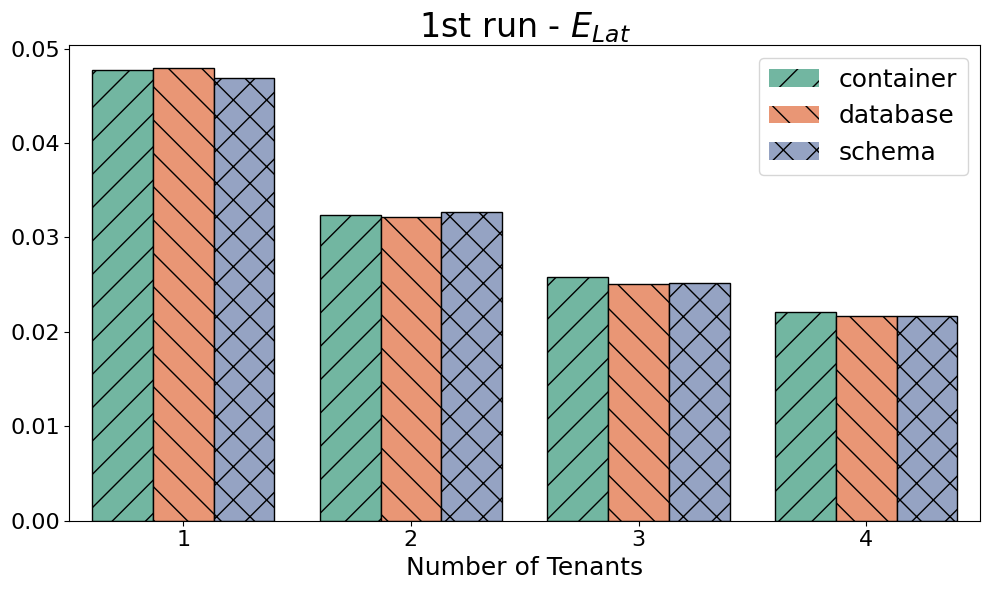

In [39]:
plot_bars(merged_df, y='E_Lat', title='1st run - $E_{Lat}$', estimator='max')

In [40]:
#plot_bars(merged_df, y='I_Lat', title='1st run - $I_{Lat}$', estimator='max')

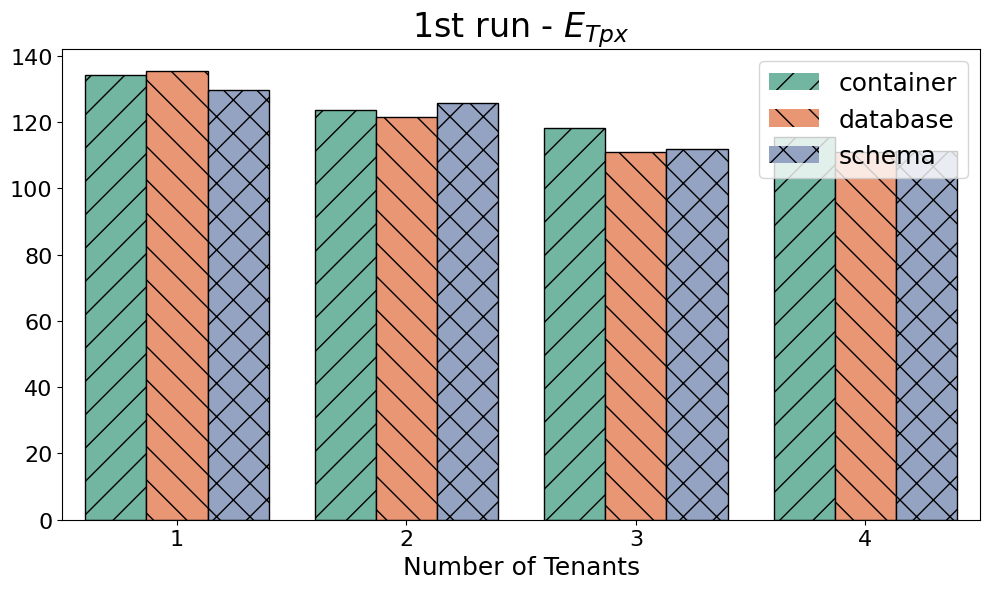

In [41]:
plot_bars(merged_df, y='E_Tpx', title='1st run - $E_{Tpx}$', estimator='max')

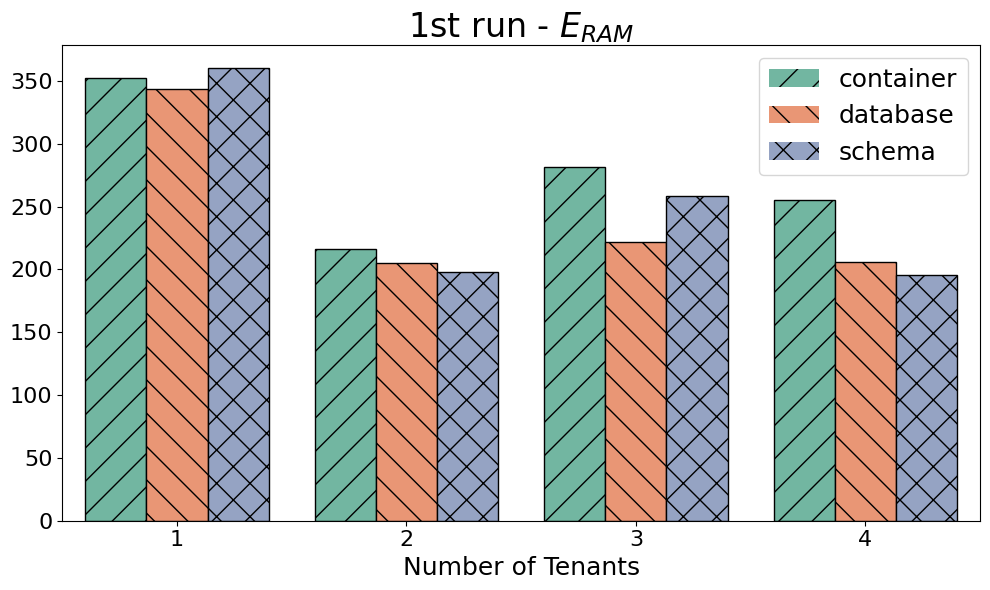

In [42]:
plot_bars(merged_df, y='E_RAM', title='1st run - $E_{RAM}$', estimator='min')

In [43]:
client = '2'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['CPUs/Request'] = merged_df['CPU [CPUs]'] / merged_df['Goodput (requests/second)'] / 600.
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU [CPUs]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU [CPUs]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Max RAM [Gb]']

merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,CPU [CPUs],Max RAM [Gb],...,Heap Hits,Sync Time,Write Time,Number Autoanalyze,Number Autovacuum,Cache Hit Ratio [%],Variance of Core Util [%],E_Tpx,E_Lat,E_RAM
0,2,4336.264926,194,22645.000000,375195,container,1,1755712809,19021.29,17.39,...,7.806612e+08,0.0,0.0,233.0,189.0,100.0000,8.19,136.781415,0.048183,249.353935
1,2,4355.929949,189,22537.000000,381814,database,1,1755709687,19963.08,17.24,...,7.815440e+08,0.0,0.0,232.0,188.0,100.0000,8.67,130.919576,0.047145,252.664150
2,2,4206.203295,208,23327.000000,361689,schema,1,1755706475,18717.36,17.23,...,7.651352e+08,0.0,0.0,221.0,185.0,100.0000,8.69,134.833223,0.047857,244.120911
3,2,7560.925590,381,25980.000000,303649,container,2,1755696350,37168.74,47.94,...,3.423106e+09,0.0,0.0,1169.0,978.0,99.3450,26.00,122.052977,0.032180,157.716429
4,2,4617.888195,219,42517.000000,755719,database,2,1755693435,22993.46,31.16,...,7.573223e+08,0.0,0.0,383.0,352.0,99.9100,11.32,120.500913,0.031983,148.199236
5,2,4736.978165,240,41474.000000,702615,schema,2,1755690481,24096.40,33.01,...,9.555812e+08,0.0,0.0,345.0,330.0,99.8800,11.46,117.950686,0.031633,143.501308
6,2,9857.203203,563,29897.666667,336775,container,3,1755723522,48194.94,43.63,...,1.718417e+09,0.0,0.0,677.0,552.0,100.0000,40.21,122.716657,0.026344,225.927188
7,2,4597.114060,217,64104.000000,907077,database,3,1755720064,23160.28,24.22,...,7.344853e+08,0.0,0.0,610.0,494.0,100.0000,10.63,119.094779,0.025953,189.806526
8,2,4354.116598,193,67729.666667,926463,schema,3,1755716684,23075.85,26.37,...,8.221868e+08,0.0,0.0,492.0,430.0,100.0000,10.36,113.212296,0.025295,165.116291
9,2,10565.652128,540,37187.750000,294799,container,4,1755734267,52194.26,53.30,...,2.405100e+09,0.0,0.0,1136.0,914.0,99.9175,49.53,121.457633,0.022698,198.229871


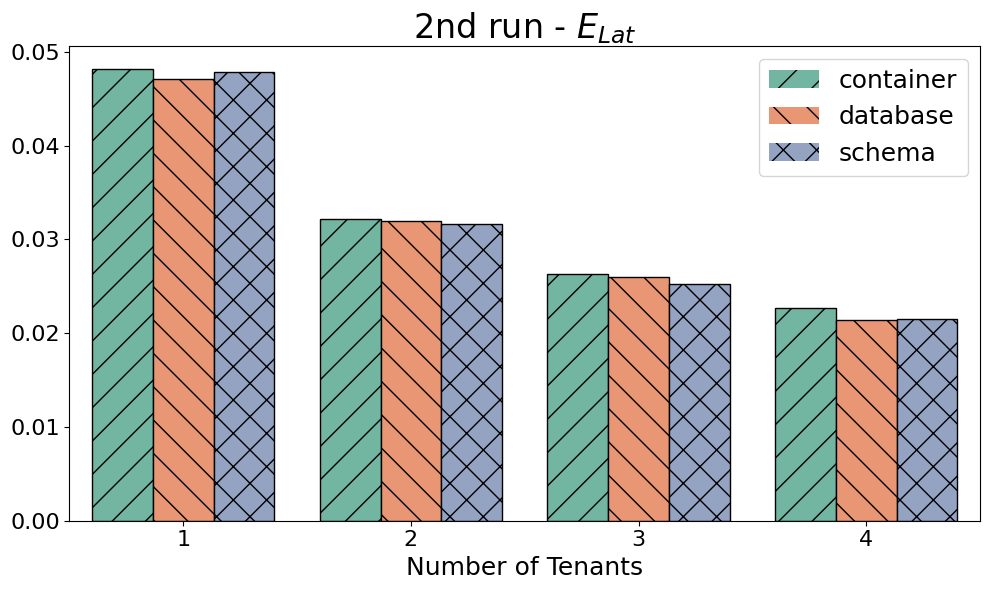

In [44]:
plot_bars(merged_df, y='E_Lat', title='2nd run - $E_{Lat}$', estimator='max')

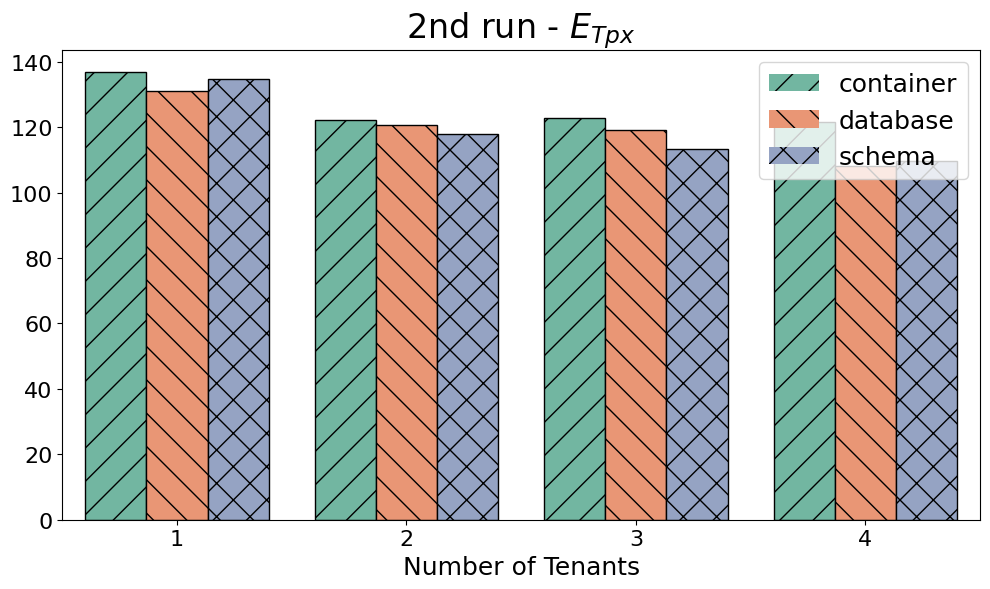

In [45]:
plot_bars(merged_df, y='E_Tpx', title='2nd run - $E_{Tpx}$', estimator='max')

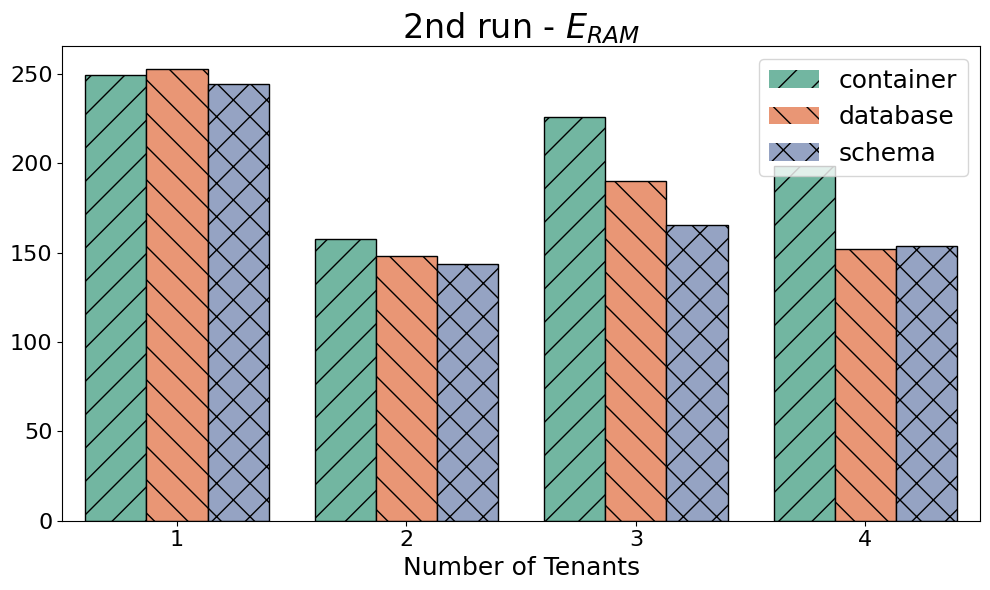

In [46]:
plot_bars(merged_df, y='E_RAM', title='2nd run - $E_{RAM}$', estimator='max')

In [56]:
import os
import zipfile

def zip_all_results():
    # Set the base directory containing the folders
    base_dir = path # "/path/to/your/folders"  # CHANGE THIS to your actual directory
    # List all folder names in the directory
    folder_names = codes
    # Create a zip for each folder
    for folder in folder_names:
        folder_path = os.path.join(base_dir, folder)
        zip_path = os.path.join(base_dir, f"{folder}.zip")
        print(f"Zipping {folder_path} to {zip_path}...")
        with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(folder_path):
                for file in files:
                    abs_path = os.path.join(root, file)
                    rel_path = os.path.relpath(abs_path, folder_path)
                    zipf.write(abs_path, arcname=os.path.join(folder, rel_path))
    print("✅ Done zipping all folders.")


In [57]:
#zip_all_results()